In [2]:
# for running in collab, sagemaker etc.
import sys
sys.path.insert(0, "/home/studio-lab-user/Generative_Models_for_CERN_Fast_Simulations/utils")

In [3]:
import wandb

In [4]:
import tensorflow as tf; print(tf.config.list_physical_devices('GPU'))

2023-03-24 15:14:13.348005: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-03-24 15:14:13.348080: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-03-24 15:14:13.348088: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [5]:
SAVE_EXPERIMENT_DATA = True

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets, linear_model, decomposition, manifold, preprocessing
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import precision_recall_curve, roc_curve, auc, accuracy_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold, KFold, train_test_split
from tensorflow.keras import layers
import pickle
import time
from numpy import load
from matplotlib import pyplot
import pickle
import argparse

import tensorflow as tf
from tensorflow import keras
print(tf.__version__)

from tensorflow.compat.v1.keras.layers import Input, Dense, LeakyReLU, Conv2D, MaxPooling2D, UpSampling2D,  Concatenate
from tensorflow.compat.v1.keras.models import Model
from tensorflow.compat.v1.keras.layers import Dense, Reshape, Flatten
from tensorflow.compat.v1.keras.layers import Dropout,BatchNormalization
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.losses import mse, binary_crossentropy, logcosh
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import plot_model
from tensorflow.keras import backend as K

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = "3"

from scipy.stats import wasserstein_distance
import pandas as pd
from utils import sum_channels_parallel
from sklearn.metrics import mean_absolute_error
from datetime import datetime

2.11.0


### Load and process data

In [7]:
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers
import time

from IPython import display
import sklearn
from sklearn.preprocessing import StandardScaler
from datetime import datetime

In [8]:
data = pd.read_pickle('../../data/data_proton_photonsum_15_2133.pkl')
print('Loaded: ',  data.shape, "max:", data.max())

# Data containing particle conditional data from particle having responses with proton photon sum in interval [70, 2312] without taking into consideration photon sums of neutron responses.
data_cond = pd.read_pickle('../../data/data_cond_photonsum_15_2133_15_3273.pkl')
print('Loaded cond: ',  data_cond.shape, "max:",data_cond.values.max(), "min:",data_cond.values.min())

Loaded:  (48714, 56, 30) max: 678.0
Loaded cond:  (48714, 12) max: 7000.0 min: -7000.0


In [9]:
# calculate min max proton sum
photon_sum_proton_min, photon_sum_proton_max = data_cond.proton_photon_sum.min(), data_cond.proton_photon_sum.max()

In [10]:
data_cond.drop(columns=['proton_photon_sum', 'neutron_photon_sum', 'Pdg'], inplace=True)
data_cond.columns, len(data_cond.columns)

(Index(['Energy', 'Vx', 'Vy', 'Vz', 'Px', 'Py', 'Pz', 'mass', 'charge'], dtype='object'),
 9)

In [11]:
data_cond.head()

,Energy,Vx,Vy,Vz,Px,Py,Pz,mass,charge
0,3192.38,0.000000e+00,0.000000e+00,0.000000e+00,0.022422,-0.182957,-3192.38,939.565413,0.0
1,3961.55,0.000000e+00,0.000000e+00,0.000000e+00,-0.076487,0.179845,3961.55,938.272081,1.0
2,2770.10,1.861170e-17,2.517190e-17,-1.689330e-13,0.305187,0.412760,-2770.10,497.611000,0.0
3,3195.12,0.000000e+00,0.000000e+00,0.000000e+00,0.560528,-0.149980,3195.11,938.272081,1.0
4,1714.07,0.000000e+00,0.000000e+00,0.000000e+00,0.457768,0.145639,-1714.07,939.565413,0.0


In [12]:
DATE_STR = datetime.now().strftime("%d_%m_%Y_%H_%M")

NAME = "vae"

EXPERIMENT_DIR_NAME = f"experiments/{NAME}_{int(photon_sum_proton_min)}_{int(photon_sum_proton_max)}_{DATE_STR}"

print("Experiment DIR: ", EXPERIMENT_DIR_NAME)

Experiment DIR:  experiments/vae_15_2133_24_03_2023_15_14


In [13]:
def create_dir(path):
    if SAVE_EXPERIMENT_DATA:
        isExist = os.path.exists(path)
        if not isExist:
            os.makedirs(path)

In [14]:
def save_scales(model_name, scaler_means, scaler_scales):
    out_fnm = f"{model_name}_scales.txt"
    res = "#means"
    for mean_ in scaler_means:
        res += "\n" + str(mean_)
    res += "\n\n#scales"
    for scale_ in scaler_scales:
        res += "\n" + str(scale_)

    filepath = f"../../{EXPERIMENT_DIR_NAME}/scales/"
    create_dir(filepath)
    with open(filepath+out_fnm, mode="w") as f:
        f.write(res)

In [15]:
data = np.log(data+1)
data = np.float32(data)
print("data max", data.max(), "min", data.min())

data max 6.5206213 min 0.0


In [16]:
x_train, x_test, y_train, y_test, = train_test_split(data, data_cond, test_size=0.2, shuffle=False, random_state=42)
print(x_train.shape, x_test.shape, y_train.shape, y_test.shape)

(38971, 56, 30) (9743, 56, 30) (38971, 9) (9743, 9)


In [17]:
scaler = StandardScaler()
# scale cond datascaler = StandardScaler()
y_train = scaler.fit_transform(y_train)
y_test = scaler.transform(y_test)
print("cond max", y_train.max(), "min", y_train.min())

#save scales
if SAVE_EXPERIMENT_DATA:
    save_scales("Proton", scaler.mean_, scaler.scale_)

cond max 22.267750474560664 min -37.89385322476621


In [18]:
# make tf datasets
dataset = tf.data.Dataset.from_tensor_slices(x_train).batch(batch_size=128)
dataset_cond = tf.data.Dataset.from_tensor_slices(y_train).batch(batch_size=128)
dataset_with_cond = tf.data.Dataset.zip((dataset,dataset_cond)).shuffle(12800)

val_dataset = tf.data.Dataset.from_tensor_slices(x_test).batch(batch_size=128)
val_dataset_cond = tf.data.Dataset.from_tensor_slices(y_test).batch(batch_size=128)
val_dataset_with_cond = tf.data.Dataset.zip((val_dataset,val_dataset_cond)).shuffle(12800)

### Define Model

In [19]:
############################ Define Models ############################
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


latent_dim = 10
cond_dim = 9
poz_dim = 6


############################ encoder ############################

input_img = Input(shape=[56,30,1],name='input_img')
input_cond = Input(shape=cond_dim,name='input_cond')
x = Conv2D(32, kernel_size=4, strides=2, padding='same')(input_img)
x = Conv2D(64, kernel_size=4, strides=2,padding='same')(x)
x = Conv2D(128, kernel_size=4, strides=2,padding='same')(x)
x = LeakyReLU(alpha=0.1)(x)
x = Flatten()(x)
x = layers.concatenate([input_cond,x])
x = layers.Dense(latent_dim*2, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])

encoder = keras.Model([input_img, input_cond], [z_mean, z_log_var, z], name="encoder")
encoder.summary()
############################ decoder ############################


x = Input(shape=(latent_dim,))
cond = Input(shape=(cond_dim,))
inputs = Concatenate(axis=1)([x, cond])

g = Dense(7*4*128)(inputs)
g = Reshape((7,4,128))(g)

g = UpSampling2D()(g)
g = Conv2D(128, kernel_size=4, padding='same')(g)
g = BatchNormalization()(g)
g = LeakyReLU(alpha=0)(g)

g = UpSampling2D()(g)
g = Conv2D(64, kernel_size=4, padding='same')(g)
g = BatchNormalization()(g)
g = LeakyReLU(alpha=0)(g)

g = UpSampling2D()(g)
g = Conv2D(32, kernel_size=4, padding='same')(g)
g = BatchNormalization()(g)
g = LeakyReLU(alpha=0)(g)

outputs = Conv2D(1, kernel_size=(1,3) ,activation='relu')(g)

generator = Model([x, cond], outputs, name='generator')
generator.summary()


# define losses
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
d_acc_r = keras.metrics.BinaryAccuracy(name="d_acc_r", threshold=0.5)
d_acc_f = keras.metrics.BinaryAccuracy(name="d_acc_r", threshold=0.5)
g_acc = keras.metrics.BinaryAccuracy(name="g_acc_g", threshold=0.5)

# define optimizer
vae_optimizer = tf.keras.optimizers.RMSprop(1e-4)

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_img (InputLayer)         [(None, 56, 30, 1)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 28, 15, 32)   544         ['input_img[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)              (None, 14, 8, 64)    32832       ['conv2d[0][0]']                 
                                                                                                  
 conv2d_2 (Conv2D)              (None, 7, 4, 128)    131200      ['conv2d_1[0][0]']               
                                                                                            

In [20]:
#trainin params

EPOCHS = 200
noise_dim = 10
num_examples_to_generate = 16


START_GENERATING_IMG_FROM_IDX = 20
# Seed to reuse for generating samples for comparison during training
seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed_cond = y_test[START_GENERATING_IMG_FROM_IDX:START_GENERATING_IMG_FROM_IDX+num_examples_to_generate]

### function to calculate ws distance between orginal and generated channels
org=np.exp(x_test)-1
ch_org = org.reshape(-1, 56,30)
ch_org = pd.DataFrame(sum_channels_parallel(ch_org)).values
del org

In [21]:
# start a new wandb run to track this script
wandb.init(
    # set the wandb project where this run will be logged
    project="Generative Models for CERN Fast Simulations",

    # track hyperparameters and run metadata
    config={
    "Model": NAME,
    "dataset": "proton_data",
    "epochs": EPOCHS,
    "Date": DATE_STR,
    "Proton_min": photon_sum_proton_min,
    "Proton_max": photon_sum_proton_max,
    "Experiment_dir_name": EXPERIMENT_DIR_NAME
    },
    
    tags=[f"proton_min_{photon_sum_proton_min}", f"proton_max_{photon_sum_proton_max}"]
)

wandb: Currently logged in as: bedkowski-patrick (generative-models-cern). Use `wandb login --relogin` to force relogin


In [22]:
def calculate_ws_ch(n_calc):
    ws= [0,0,0,0,0]
    for j in range(n_calc):
        z = np.random.normal(0,1,(x_test.shape[0],10))
        z_c = y_test
        results = generator.predict([z,z_c])
        results = np.exp(results)-1
        try:
            ch_gen = np.array(results).reshape(-1,56,30)
            ch_gen = pd.DataFrame(sum_channels_parallel(ch_gen)).values
            for i in range(5):
                ws[i] = ws[i] + wasserstein_distance(ch_org[:,i], ch_gen[:,i])
            ws = np.array(ws)
        except ValueError as e:
            print(e)

    ws = ws/n_calc
    ws_mean = ws.sum()/5
    print("ws mean",f'{ws_mean:.2f}', end=" ")
    for n, score in enumerate(ws):
        print("ch"+str(n+1),f'{score:.2f}',end=" ")
    return ws_mean


####################### training ##############################
@tf.function
def train_step(batch,step):

    images, cond = batch
    step=step
    BATCH_SIZE = tf.shape(images)[0]

    #train vae
    with tf.GradientTape() as tape:
        z_mean, z_log_var, z = encoder([images, cond])
        reconstruction = generator([z, cond])
        reconstruction_loss = tf.reduce_mean(
            tf.reduce_sum(
                keras.losses.mean_squared_error(tf.reshape(images,(-1,56,30,1)), reconstruction), axis=(1, 2)
            )
        )
        kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
        kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
        total_loss = 0.7 * kl_loss + reconstruction_loss
    grads = tape.gradient(total_loss, generator.trainable_weights+encoder.trainable_weights)
    vae_optimizer.apply_gradients(zip(grads, generator.trainable_weights+encoder.trainable_weights))

    return total_loss, reconstruction_loss, kl_loss

In [23]:
if SAVE_EXPERIMENT_DATA:
    filepath_mod = f"../../{EXPERIMENT_DIR_NAME}/models/"
    create_dir(filepath_mod)

history = []
history_loss = []
def train(dataset, epochs):
    tf_step = tf.Variable(0, dtype=float)
    step=0
    generate_and_save_images(generator,
                             epochs,
                             [seed, seed_cond])
    #print(calculate_ws_mae(3))
    for epoch in range(epochs):
        start = time.time()

        for batch in dataset:
            total_loss, reconstruction_loss, kl_loss =train_step(batch,tf_step)
            history.append([total_loss, reconstruction_loss, kl_loss])
            tf_step.assign_add(1)
            step = step+1

            if step%100==0:
                print("%d [Total loss: %.2f] [Recon_loss: %.2f] [KL loss: %.2f]"% (
                    step, total_loss, reconstruction_loss, kl_loss))

        generate_and_save_images(generator,
                                 epoch,
                                 [seed, seed_cond]
                                 )

        if SAVE_EXPERIMENT_DATA:
            # Save the model every epoch
            encoder.compile()
            generator.compile()
            encoder.save(os.path.join(filepath_mod, "enc_"+NAME + "_"+ str(epoch) +".h5"))
            generator.save(os.path.join(filepath_mod, "gen_"+NAME + "_"+ str(epoch) +".h5"))
            np.savez(os.path.join(filepath_mod, "history_"+NAME+".npz"),
                     np.array(history))
        ws_mean = calculate_ws_ch(min(epoch//5+1, 5))
        
        wandb.log({
            'ws_mean': ws_mean, 
            'epoch': epoch
        })

        print('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

    return history

In [24]:
filepath_img = f"../../{EXPERIMENT_DIR_NAME}/images/"
create_dir(filepath_img)

def generate_and_save_images(model, epoch, test_input):
    
    SUPTITLE_TXT = f"\nModel: VAE proton data" \
               f"\nPhotonsum interval: [{photon_sum_proton_min}, {photon_sum_proton_max}]" \
               f"\nEPOCH: {epoch}"
    # Notice `training` is set to False.
    # This is so all layers run in inference mode (batchnorm).
    predictions = model(test_input, training=False)  # returns 16 responses
    fig, axs = plt.subplots(2, 7, figsize=(15, 5))
    fig.suptitle(SUPTITLE_TXT, x=0.1, horizontalalignment='left')
    
    for i in range(0, 14):
        if i < 7:
            x = x_test[START_GENERATING_IMG_FROM_IDX+i].reshape(56, 30)
        else:
            x = predictions[i-7].numpy().reshape(56, 30)
        #x[x<=0]=x.max()*-0.1
        im = axs[i // 7, i % 7].imshow(x, cmap='gnuplot')
        axs[i // 7, i % 7].axis('off')
        fig.colorbar(im, ax=axs[i // 7, i % 7])

    fig.tight_layout(rect=[0, 0, 1, 0.975])
    if SAVE_EXPERIMENT_DATA:
        plt.savefig(os.path.join(filepath_img, 'image_at_epoch_{:04d}.png'.format(epoch)))
    plt.show()

### Train model

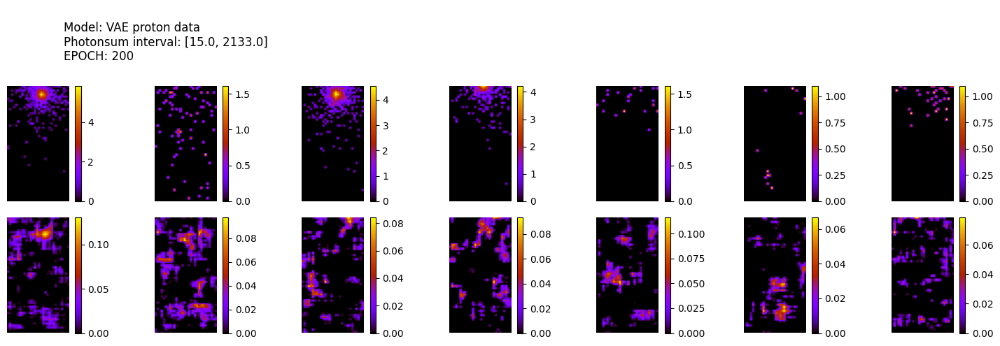

100 [Total loss: 52.70] [Recon_loss: 50.05] [KL loss: 3.78]
200 [Total loss: 47.23] [Recon_loss: 44.74] [KL loss: 3.56]
300 [Total loss: 50.85] [Recon_loss: 47.66] [KL loss: 4.55]


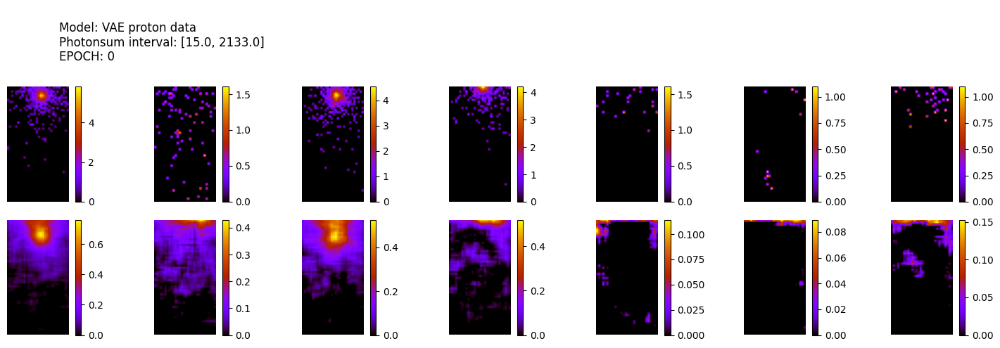

305/305 [==============================] - 2s 4ms/step
ws mean 40.86 ch1 0.02 ch2 8.00 ch3 0.33 ch4 93.97 ch5 102.00 Time for epoch 1 is 23.887561798095703 sec
400 [Total loss: 50.81] [Recon_loss: 48.07] [KL loss: 3.91]
500 [Total loss: 42.04] [Recon_loss: 40.13] [KL loss: 2.73]
600 [Total loss: 53.34] [Recon_loss: 50.84] [KL loss: 3.57]


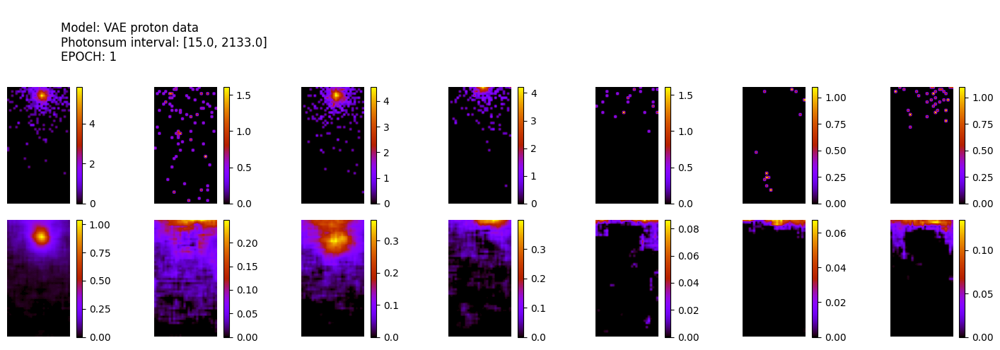

305/305 [==============================] - 1s 4ms/step
ws mean 41.78 ch1 0.02 ch2 8.13 ch3 0.36 ch4 96.09 ch5 104.31 Time for epoch 2 is 17.691647052764893 sec
700 [Total loss: 40.24] [Recon_loss: 38.22] [KL loss: 2.89]
800 [Total loss: 41.62] [Recon_loss: 39.97] [KL loss: 2.36]
900 [Total loss: 38.07] [Recon_loss: 36.51] [KL loss: 2.23]


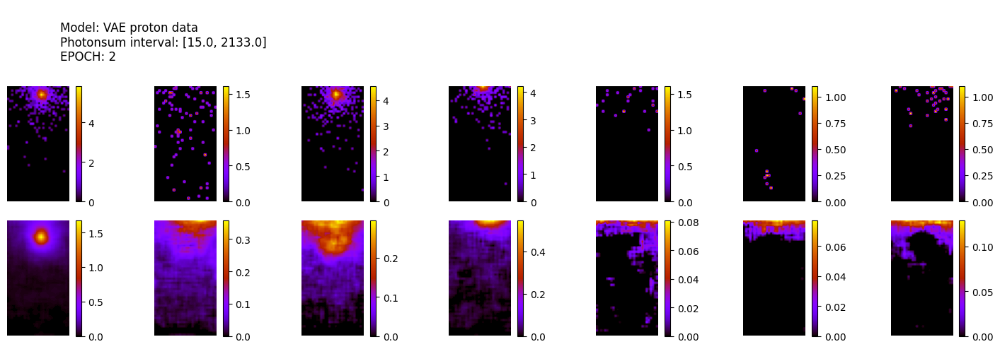

305/305 [==============================] - 1s 4ms/step
ws mean 38.21 ch1 0.02 ch2 6.65 ch3 0.32 ch4 88.72 ch5 95.35 Time for epoch 3 is 17.947627782821655 sec
1000 [Total loss: 31.71] [Recon_loss: 30.36] [KL loss: 1.93]
1100 [Total loss: 39.96] [Recon_loss: 38.35] [KL loss: 2.30]
1200 [Total loss: 42.88] [Recon_loss: 41.13] [KL loss: 2.51]


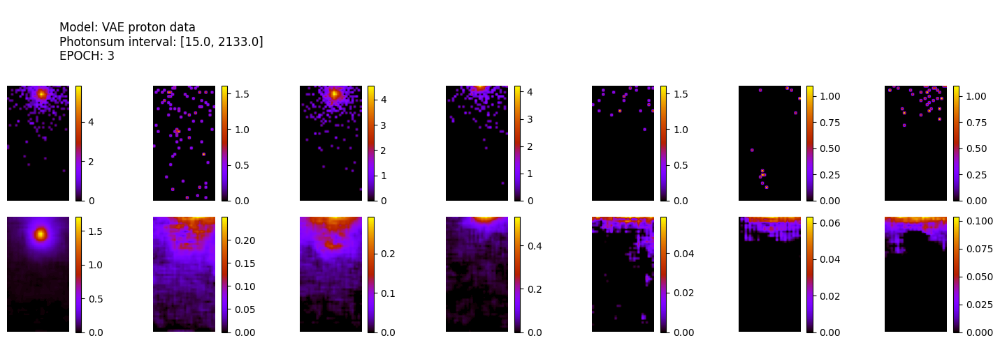

305/305 [==============================] - 1s 4ms/step
ws mean 41.73 ch1 0.02 ch2 8.41 ch3 0.35 ch4 95.64 ch5 104.21 Time for epoch 4 is 17.92369556427002 sec
1300 [Total loss: 36.40] [Recon_loss: 34.97] [KL loss: 2.05]
1400 [Total loss: 48.12] [Recon_loss: 46.46] [KL loss: 2.38]
1500 [Total loss: 45.23] [Recon_loss: 43.43] [KL loss: 2.57]


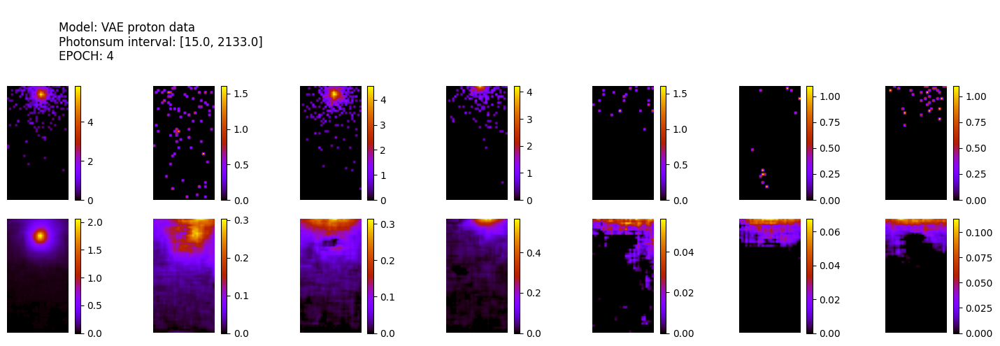

305/305 [==============================] - 1s 4ms/step
ws mean 38.21 ch1 0.02 ch2 7.04 ch3 0.32 ch4 88.24 ch5 95.42 Time for epoch 5 is 18.093372344970703 sec
1600 [Total loss: 44.15] [Recon_loss: 42.46] [KL loss: 2.42]
1700 [Total loss: 43.93] [Recon_loss: 42.22] [KL loss: 2.45]
1800 [Total loss: 43.41] [Recon_loss: 42.12] [KL loss: 1.85]


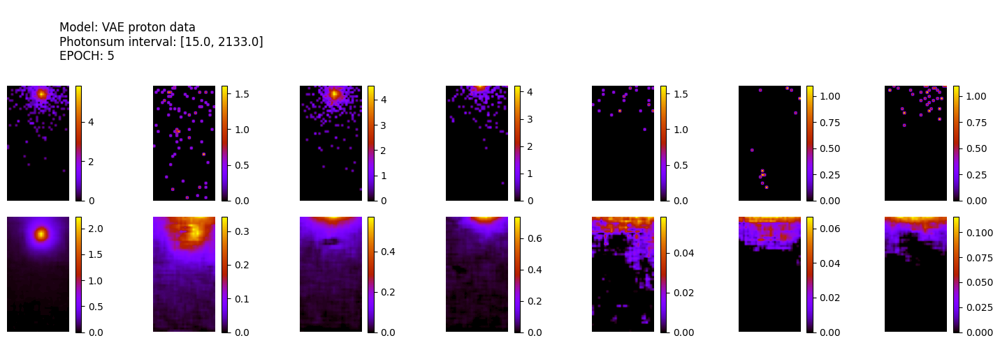

305/305 [==============================] - 1s 4ms/step
ws mean 34.47 ch1 0.02 ch2 6.55 ch3 0.30 ch4 79.50 ch5 85.99 Time for epoch 6 is 20.693939685821533 sec
1900 [Total loss: 44.07] [Recon_loss: 42.79] [KL loss: 1.82]
2000 [Total loss: 40.79] [Recon_loss: 39.32] [KL loss: 2.09]
2100 [Total loss: 40.24] [Recon_loss: 38.98] [KL loss: 1.80]


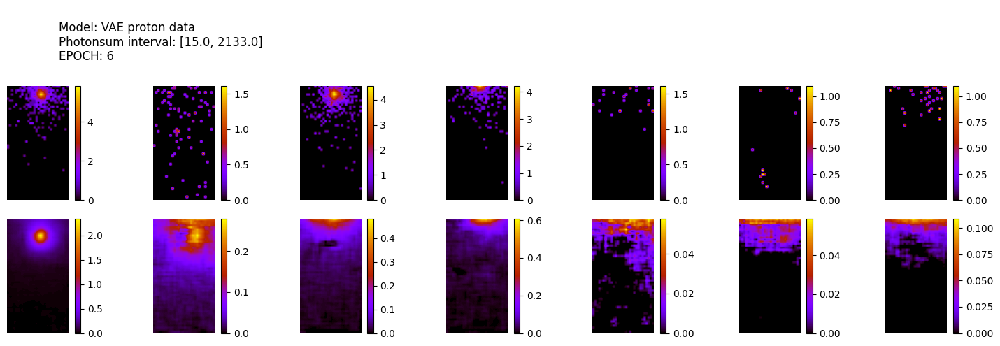

305/305 [==============================] - 1s 4ms/step
ws mean 36.49 ch1 0.02 ch2 7.15 ch3 0.30 ch4 83.88 ch5 91.12 Time for epoch 7 is 20.92470383644104 sec
2200 [Total loss: 43.75] [Recon_loss: 42.29] [KL loss: 2.09]
2300 [Total loss: 48.65] [Recon_loss: 46.86] [KL loss: 2.56]
2400 [Total loss: 47.55] [Recon_loss: 46.05] [KL loss: 2.15]


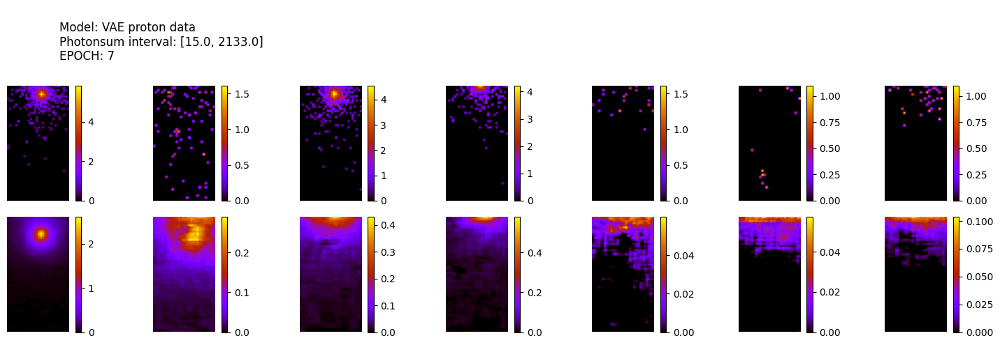

305/305 [==============================] - 1s 4ms/step
ws mean 35.62 ch1 0.02 ch2 7.19 ch3 0.29 ch4 81.74 ch5 88.84 Time for epoch 8 is 20.85006022453308 sec
2500 [Total loss: 39.51] [Recon_loss: 38.31] [KL loss: 1.71]
2600 [Total loss: 38.98] [Recon_loss: 37.81] [KL loss: 1.67]
2700 [Total loss: 37.96] [Recon_loss: 36.86] [KL loss: 1.58]


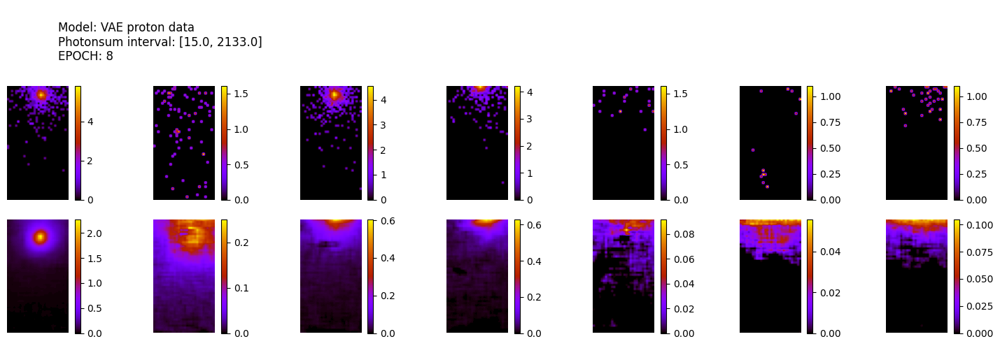

305/305 [==============================] - 1s 4ms/step
ws mean 35.10 ch1 0.02 ch2 7.03 ch3 0.32 ch4 80.64 ch5 87.52 Time for epoch 9 is 20.671499490737915 sec
2800 [Total loss: 39.56] [Recon_loss: 38.39] [KL loss: 1.66]
2900 [Total loss: 42.98] [Recon_loss: 41.62] [KL loss: 1.95]
3000 [Total loss: 39.94] [Recon_loss: 38.87] [KL loss: 1.53]


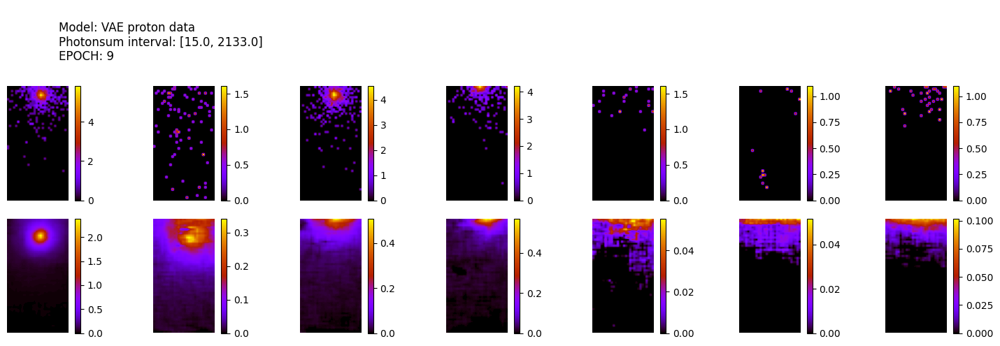

305/305 [==============================] - 1s 4ms/step
ws mean 36.05 ch1 0.02 ch2 7.51 ch3 0.33 ch4 82.42 ch5 89.96 Time for epoch 10 is 20.882980346679688 sec
3100 [Total loss: 39.11] [Recon_loss: 38.10] [KL loss: 1.45]
3200 [Total loss: 41.42] [Recon_loss: 40.12] [KL loss: 1.86]
3300 [Total loss: 32.29] [Recon_loss: 31.50] [KL loss: 1.12]


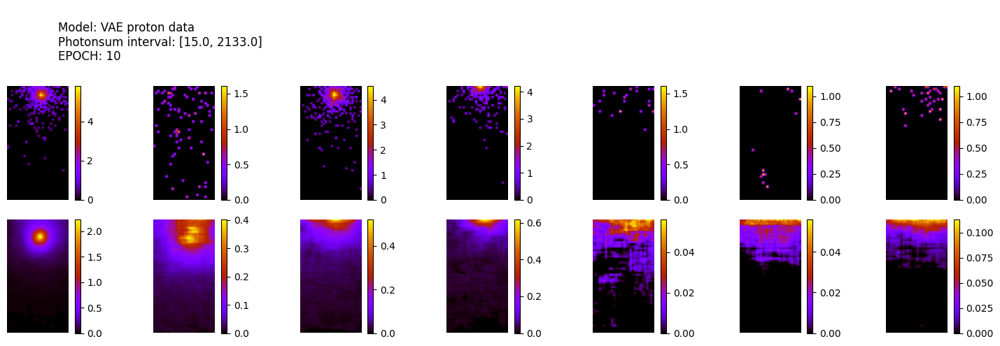

305/305 [==============================] - 1s 4ms/step
ws mean 33.05 ch1 0.02 ch2 6.55 ch3 0.28 ch4 75.94 ch5 82.48 Time for epoch 11 is 23.50656294822693 sec
3400 [Total loss: 38.35] [Recon_loss: 37.33] [KL loss: 1.47]
3500 [Total loss: 38.56] [Recon_loss: 37.56] [KL loss: 1.43]
3600 [Total loss: 41.03] [Recon_loss: 39.99] [KL loss: 1.48]


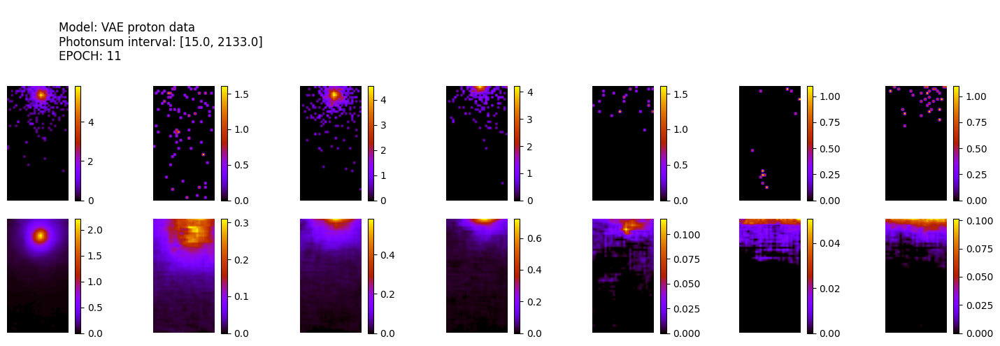

305/305 [==============================] - 1s 4ms/step
ws mean 35.07 ch1 0.02 ch2 7.01 ch3 0.32 ch4 80.51 ch5 87.49 Time for epoch 12 is 23.083897352218628 sec
3700 [Total loss: 43.35] [Recon_loss: 42.09] [KL loss: 1.81]
3800 [Total loss: 43.98] [Recon_loss: 42.63] [KL loss: 1.93]
3900 [Total loss: 42.62] [Recon_loss: 41.60] [KL loss: 1.45]


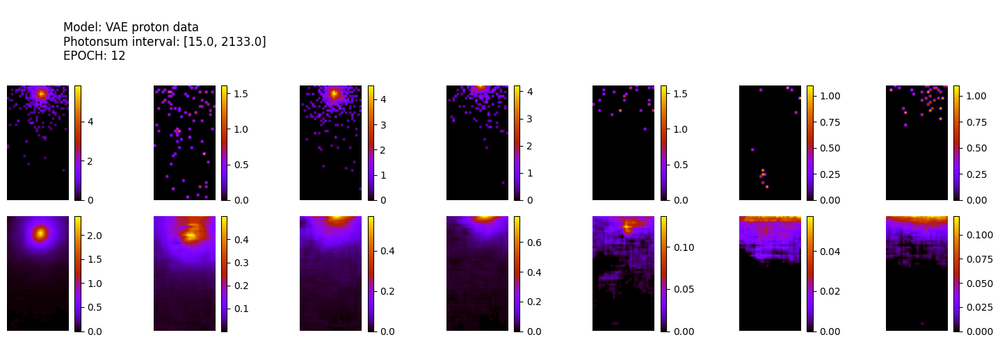

305/305 [==============================] - 1s 4ms/step
ws mean 30.67 ch1 0.02 ch2 5.86 ch3 0.31 ch4 70.60 ch5 76.56 Time for epoch 13 is 23.46055769920349 sec
4000 [Total loss: 42.22] [Recon_loss: 41.17] [KL loss: 1.51]
4100 [Total loss: 47.96] [Recon_loss: 46.41] [KL loss: 2.21]
4200 [Total loss: 46.79] [Recon_loss: 45.50] [KL loss: 1.85]


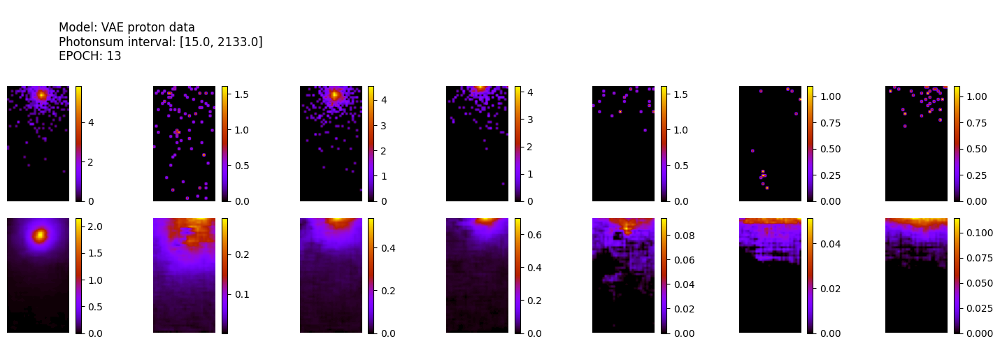

305/305 [==============================] - 1s 4ms/step
ws mean 34.54 ch1 0.02 ch2 7.15 ch3 0.32 ch4 78.96 ch5 86.25 Time for epoch 14 is 23.54928493499756 sec
4300 [Total loss: 41.82] [Recon_loss: 40.74] [KL loss: 1.55]
4400 [Total loss: 44.65] [Recon_loss: 43.47] [KL loss: 1.68]
4500 [Total loss: 43.34] [Recon_loss: 42.23] [KL loss: 1.58]


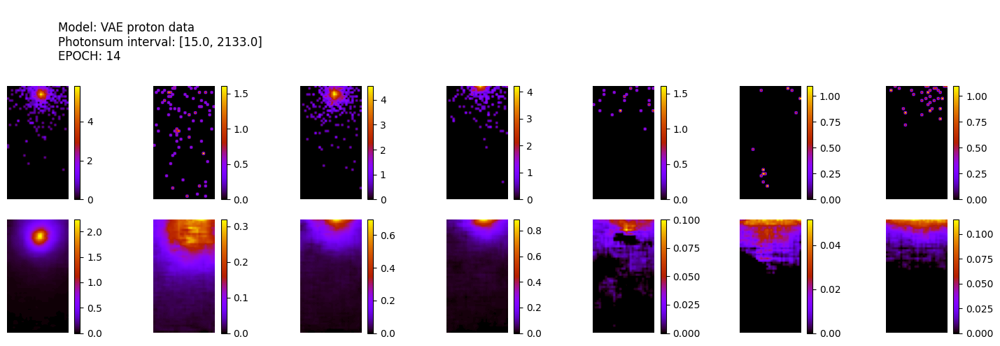

305/305 [==============================] - 1s 4ms/step
ws mean 29.12 ch1 0.02 ch2 6.43 ch3 0.23 ch4 66.34 ch5 72.60 Time for epoch 15 is 23.317205667495728 sec
4600 [Total loss: 37.02] [Recon_loss: 36.12] [KL loss: 1.28]
4700 [Total loss: 43.18] [Recon_loss: 41.98] [KL loss: 1.72]
4800 [Total loss: 42.52] [Recon_loss: 41.27] [KL loss: 1.78]


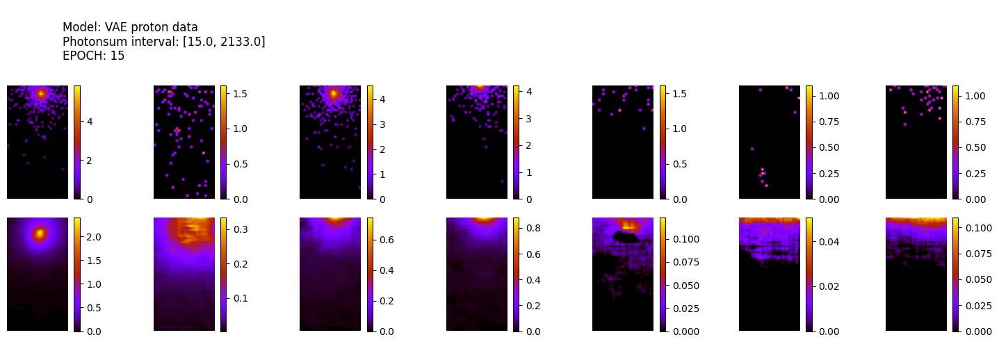

305/305 [==============================] - 1s 4ms/step
ws mean 31.10 ch1 0.02 ch2 6.85 ch3 0.28 ch4 70.60 ch5 77.76 Time for epoch 16 is 26.168469667434692 sec
4900 [Total loss: 38.86] [Recon_loss: 37.93] [KL loss: 1.32]
5000 [Total loss: 45.14] [Recon_loss: 43.97] [KL loss: 1.66]
5100 [Total loss: 43.25] [Recon_loss: 42.25] [KL loss: 1.42]


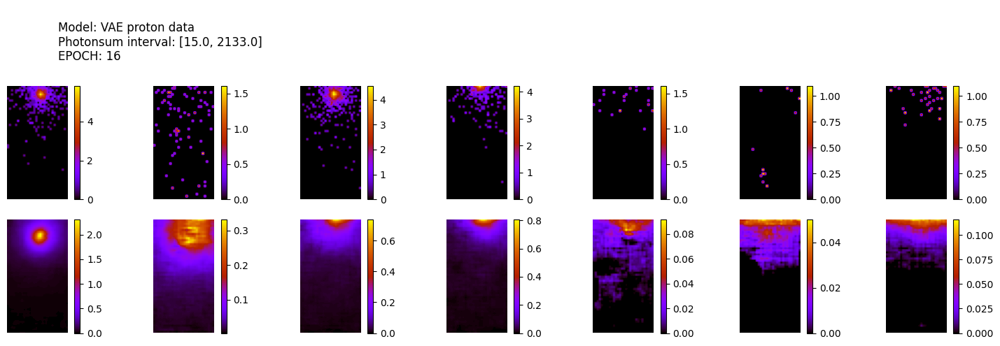

305/305 [==============================] - 1s 4ms/step
ws mean 31.13 ch1 0.02 ch2 6.10 ch3 0.28 ch4 71.66 ch5 77.61 Time for epoch 17 is 26.220332145690918 sec
5200 [Total loss: 40.28] [Recon_loss: 39.33] [KL loss: 1.36]
5300 [Total loss: 37.29] [Recon_loss: 36.46] [KL loss: 1.19]
5400 [Total loss: 38.86] [Recon_loss: 38.02] [KL loss: 1.21]


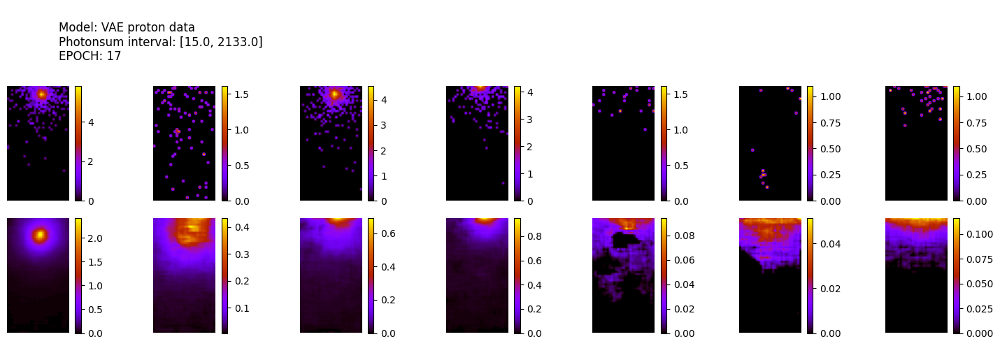

305/305 [==============================] - 1s 4ms/step
ws mean 27.87 ch1 0.02 ch2 5.55 ch3 0.27 ch4 64.09 ch5 69.45 Time for epoch 18 is 25.959981679916382 sec
5500 [Total loss: 44.97] [Recon_loss: 43.75] [KL loss: 1.74]
5600 [Total loss: 44.66] [Recon_loss: 43.48] [KL loss: 1.69]
5700 [Total loss: 41.80] [Recon_loss: 40.78] [KL loss: 1.46]


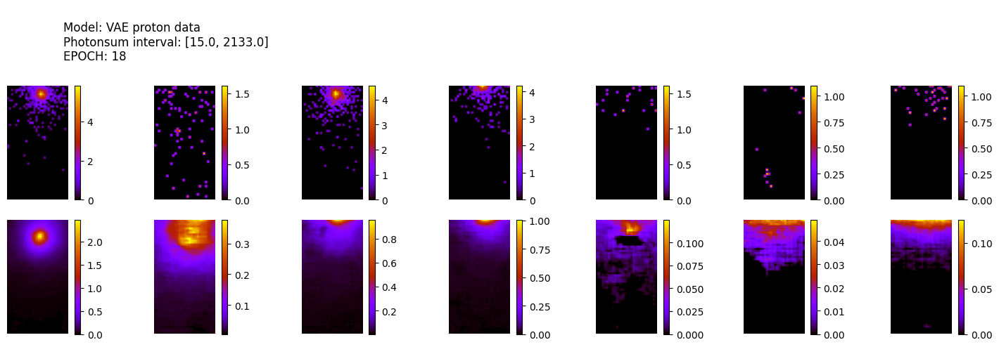

305/305 [==============================] - 1s 4ms/step
ws mean 28.95 ch1 0.02 ch2 6.15 ch3 0.29 ch4 66.10 ch5 72.21 Time for epoch 19 is 26.100414276123047 sec
5800 [Total loss: 45.72] [Recon_loss: 44.49] [KL loss: 1.76]
5900 [Total loss: 41.58] [Recon_loss: 40.58] [KL loss: 1.42]
6000 [Total loss: 33.02] [Recon_loss: 32.34] [KL loss: 0.97]
6100 [Total loss: 40.40] [Recon_loss: 39.50] [KL loss: 1.29]


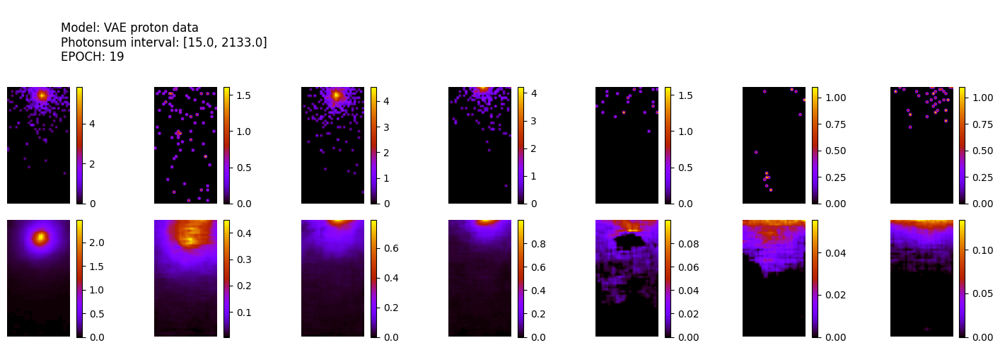

305/305 [==============================] - 1s 4ms/step
ws mean 28.85 ch1 0.02 ch2 5.65 ch3 0.28 ch4 66.43 ch5 71.89 Time for epoch 20 is 26.202857732772827 sec
6200 [Total loss: 43.61] [Recon_loss: 42.53] [KL loss: 1.54]
6300 [Total loss: 44.53] [Recon_loss: 43.52] [KL loss: 1.43]
6400 [Total loss: 28.92] [Recon_loss: 28.34] [KL loss: 0.83]


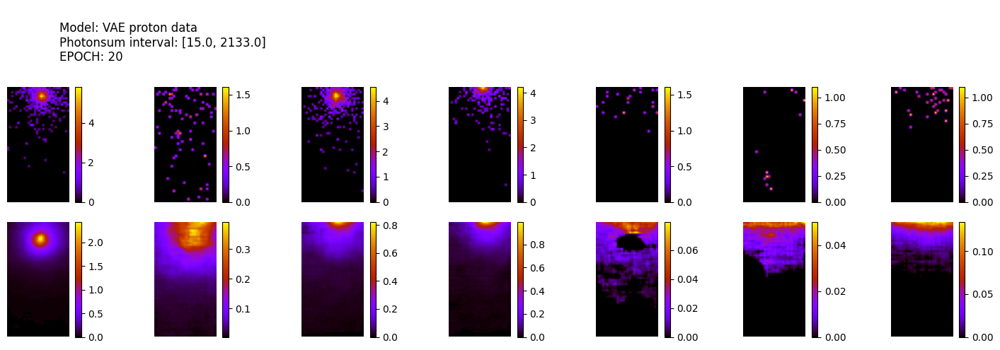

305/305 [==============================] - 1s 4ms/step
ws mean 28.61 ch1 0.02 ch2 5.85 ch3 0.26 ch4 65.50 ch5 71.42 Time for epoch 21 is 28.942161560058594 sec
6500 [Total loss: 34.23] [Recon_loss: 33.50] [KL loss: 1.05]
6600 [Total loss: 44.81] [Recon_loss: 43.82] [KL loss: 1.41]
6700 [Total loss: 43.08] [Recon_loss: 42.05] [KL loss: 1.47]


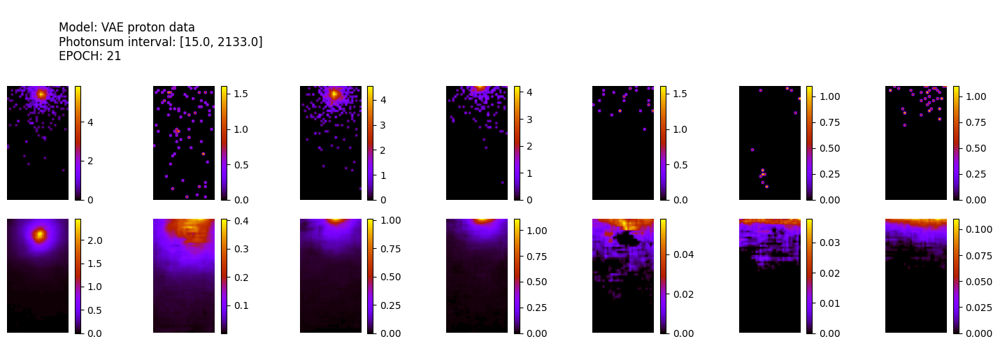

305/305 [==============================] - 1s 4ms/step
ws mean 29.15 ch1 0.02 ch2 7.08 ch3 0.29 ch4 65.65 ch5 72.71 Time for epoch 22 is 28.862525701522827 sec
6800 [Total loss: 42.73] [Recon_loss: 41.84] [KL loss: 1.27]
6900 [Total loss: 35.69] [Recon_loss: 34.88] [KL loss: 1.15]
7000 [Total loss: 34.75] [Recon_loss: 33.98] [KL loss: 1.09]


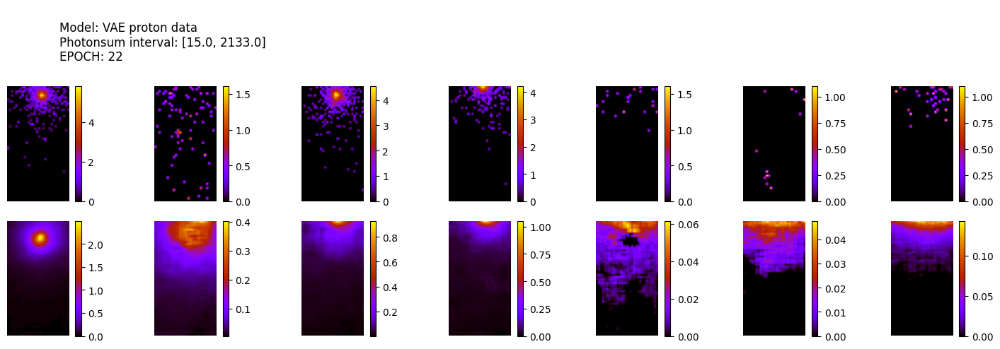

305/305 [==============================] - 1s 4ms/step
ws mean 27.32 ch1 0.02 ch2 5.52 ch3 0.28 ch4 62.81 ch5 67.96 Time for epoch 23 is 28.8940691947937 sec
7100 [Total loss: 37.63] [Recon_loss: 36.88] [KL loss: 1.08]
7200 [Total loss: 31.44] [Recon_loss: 30.87] [KL loss: 0.81]
7300 [Total loss: 37.51] [Recon_loss: 36.80] [KL loss: 1.01]


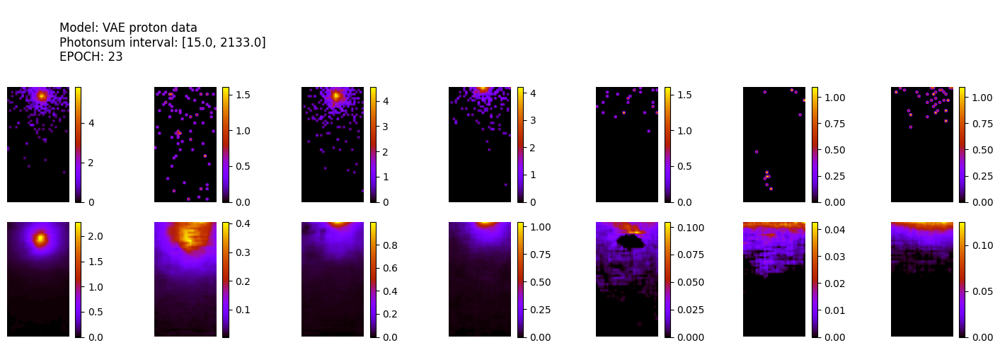

305/305 [==============================] - 1s 4ms/step
ws mean 28.17 ch1 0.02 ch2 6.47 ch3 0.24 ch4 63.92 ch5 70.22 Time for epoch 24 is 28.97260069847107 sec
7400 [Total loss: 41.70] [Recon_loss: 40.79] [KL loss: 1.29]
7500 [Total loss: 47.43] [Recon_loss: 46.22] [KL loss: 1.73]
7600 [Total loss: 43.01] [Recon_loss: 41.95] [KL loss: 1.51]


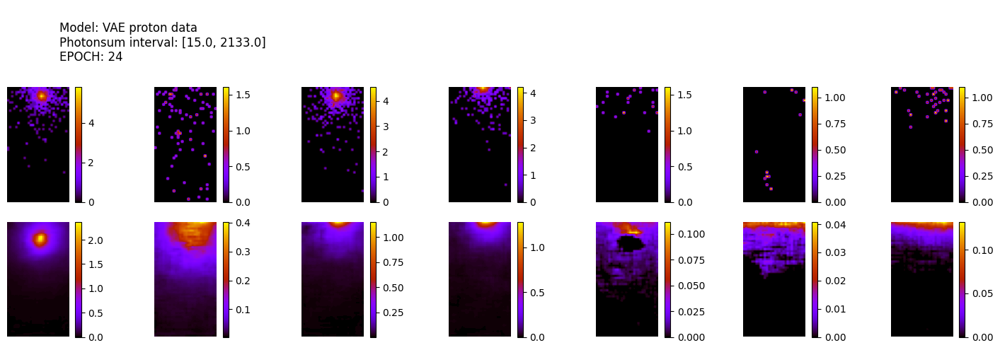

305/305 [==============================] - 1s 4ms/step
ws mean 28.58 ch1 0.02 ch2 6.49 ch3 0.27 ch4 64.85 ch5 71.29 Time for epoch 25 is 28.743515729904175 sec
7700 [Total loss: 36.93] [Recon_loss: 36.24] [KL loss: 0.99]
7800 [Total loss: 37.79] [Recon_loss: 36.99] [KL loss: 1.14]
7900 [Total loss: 33.38] [Recon_loss: 32.81] [KL loss: 0.81]


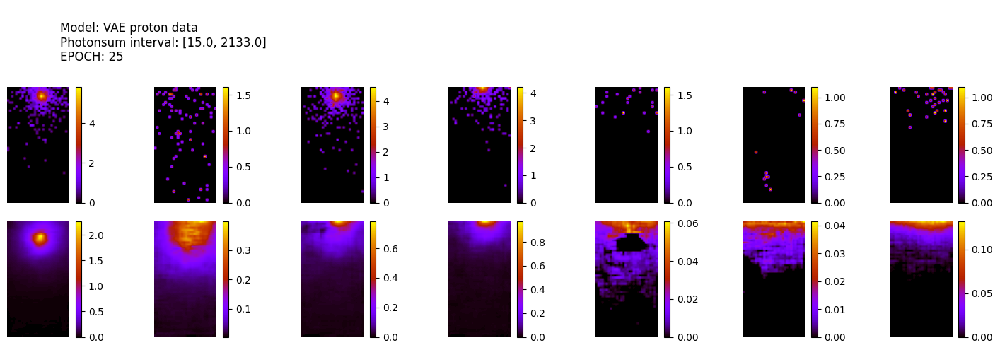

305/305 [==============================] - 1s 4ms/step
ws mean 28.45 ch1 0.02 ch2 6.21 ch3 0.26 ch4 64.87 ch5 70.89 Time for epoch 26 is 28.95419692993164 sec
8000 [Total loss: 37.41] [Recon_loss: 36.68] [KL loss: 1.05]
8100 [Total loss: 36.05] [Recon_loss: 35.39] [KL loss: 0.94]
8200 [Total loss: 46.60] [Recon_loss: 45.62] [KL loss: 1.40]


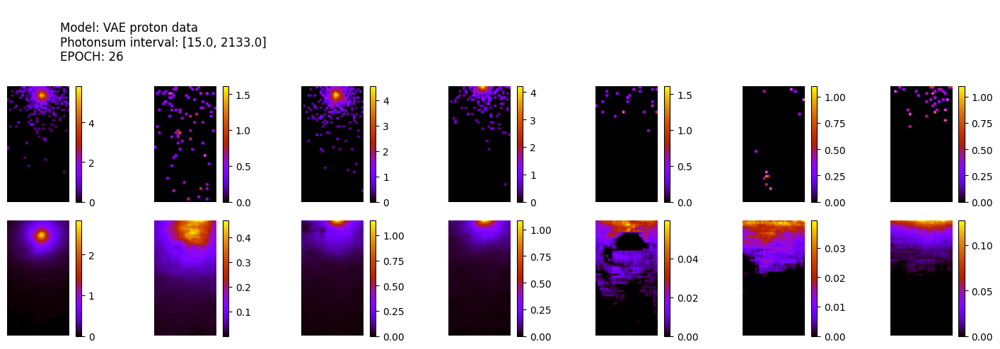

305/305 [==============================] - 1s 4ms/step
ws mean 24.74 ch1 0.02 ch2 6.09 ch3 0.26 ch4 55.60 ch5 61.70 Time for epoch 27 is 28.627158164978027 sec
8300 [Total loss: 37.27] [Recon_loss: 36.55] [KL loss: 1.03]
8400 [Total loss: 44.01] [Recon_loss: 43.15] [KL loss: 1.24]
8500 [Total loss: 41.22] [Recon_loss: 40.29] [KL loss: 1.33]


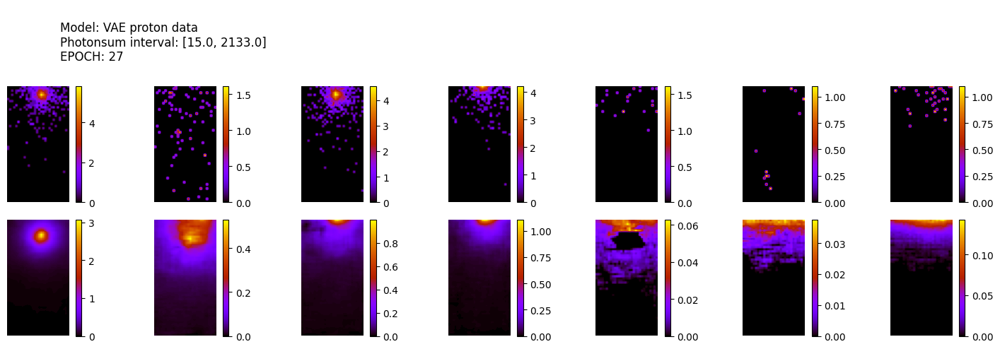

305/305 [==============================] - 1s 4ms/step
ws mean 26.42 ch1 0.02 ch2 6.49 ch3 0.25 ch4 59.55 ch5 65.76 Time for epoch 28 is 28.902950048446655 sec
8600 [Total loss: 34.94] [Recon_loss: 34.23] [KL loss: 1.01]
8700 [Total loss: 41.87] [Recon_loss: 40.93] [KL loss: 1.34]
8800 [Total loss: 45.79] [Recon_loss: 44.78] [KL loss: 1.45]


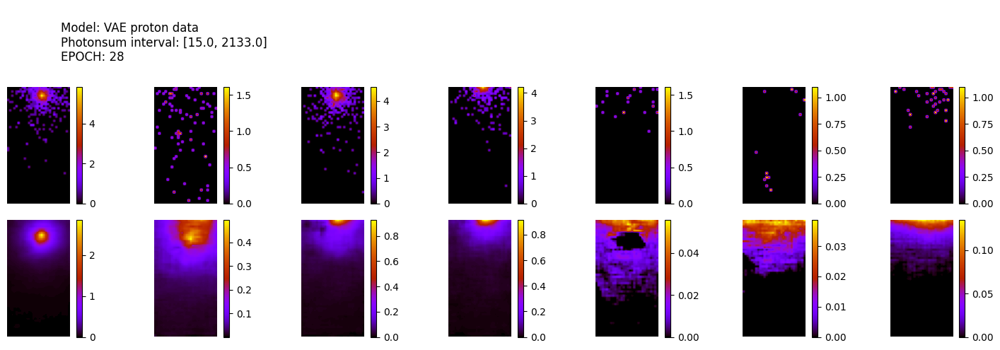

305/305 [==============================] - 1s 4ms/step
ws mean 27.06 ch1 0.02 ch2 5.78 ch3 0.25 ch4 61.83 ch5 67.40 Time for epoch 29 is 28.730738878250122 sec
8900 [Total loss: 40.49] [Recon_loss: 39.66] [KL loss: 1.19]
9000 [Total loss: 37.91] [Recon_loss: 37.08] [KL loss: 1.18]
9100 [Total loss: 38.16] [Recon_loss: 37.40] [KL loss: 1.08]


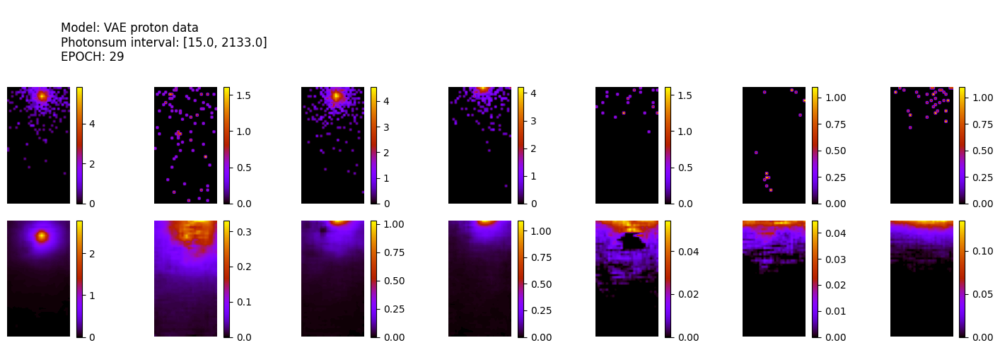

305/305 [==============================] - 1s 4ms/step
ws mean 30.42 ch1 0.02 ch2 7.11 ch3 0.30 ch4 68.83 ch5 75.87 Time for epoch 30 is 29.04470920562744 sec
9200 [Total loss: 38.19] [Recon_loss: 37.49] [KL loss: 1.01]
9300 [Total loss: 31.33] [Recon_loss: 30.78] [KL loss: 0.78]
9400 [Total loss: 42.81] [Recon_loss: 41.86] [KL loss: 1.36]


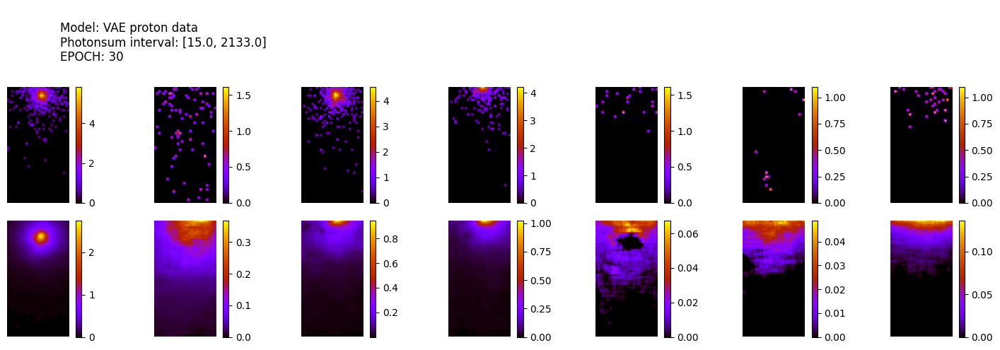

305/305 [==============================] - 1s 4ms/step
ws mean 29.92 ch1 0.02 ch2 6.26 ch3 0.30 ch4 68.41 ch5 74.60 Time for epoch 31 is 28.889672994613647 sec
9500 [Total loss: 38.12] [Recon_loss: 37.45] [KL loss: 0.97]
9600 [Total loss: 44.85] [Recon_loss: 43.92] [KL loss: 1.33]
9700 [Total loss: 44.10] [Recon_loss: 43.24] [KL loss: 1.23]


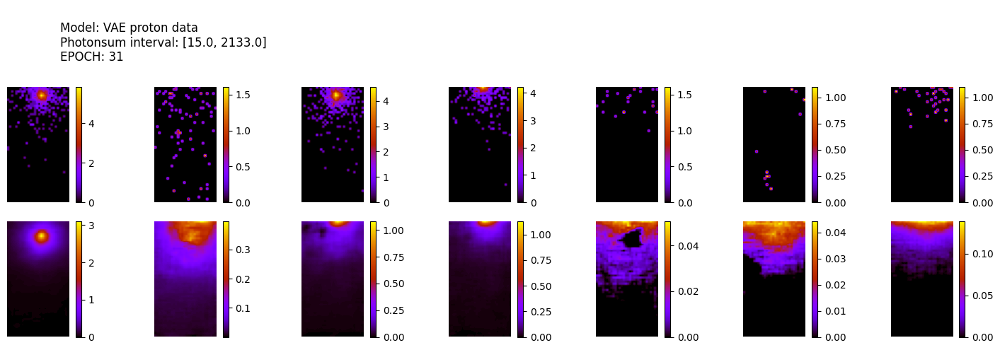

305/305 [==============================] - 1s 4ms/step
ws mean 26.77 ch1 0.02 ch2 5.88 ch3 0.28 ch4 60.96 ch5 66.74 Time for epoch 32 is 29.115855932235718 sec
9800 [Total loss: 38.18] [Recon_loss: 37.35] [KL loss: 1.18]
9900 [Total loss: 39.42] [Recon_loss: 38.59] [KL loss: 1.18]
10000 [Total loss: 36.16] [Recon_loss: 35.51] [KL loss: 0.93]


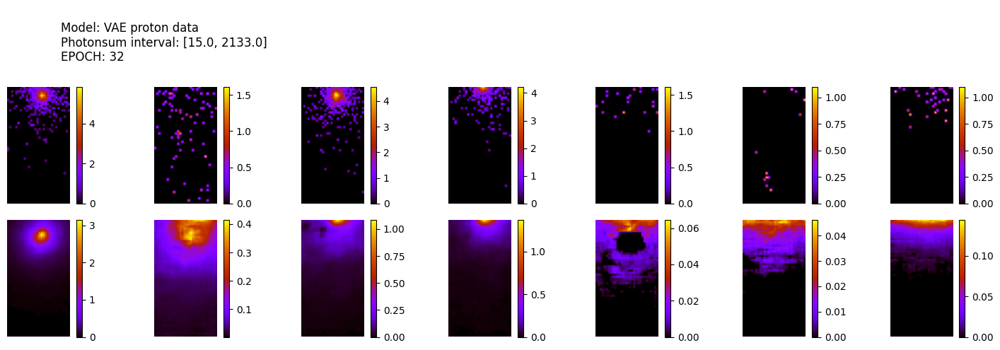

305/305 [==============================] - 1s 4ms/step
ws mean 25.60 ch1 0.02 ch2 6.06 ch3 0.27 ch4 57.79 ch5 63.88 Time for epoch 33 is 28.655020236968994 sec
10100 [Total loss: 43.64] [Recon_loss: 42.75] [KL loss: 1.26]
10200 [Total loss: 41.94] [Recon_loss: 40.97] [KL loss: 1.38]
10300 [Total loss: 40.62] [Recon_loss: 39.91] [KL loss: 1.01]


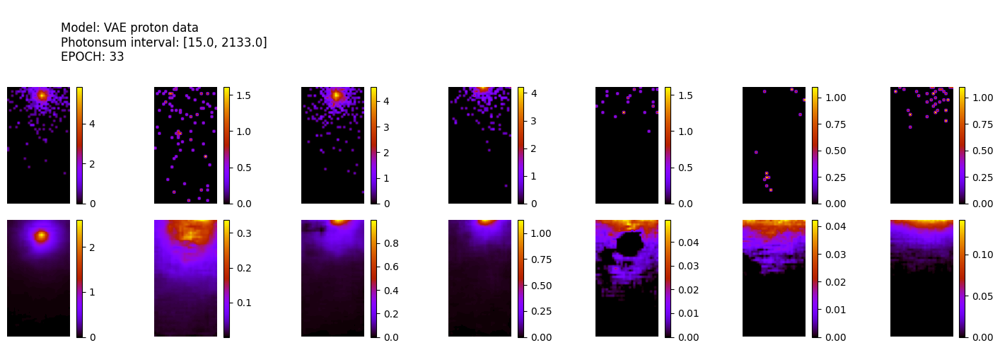

305/305 [==============================] - 1s 4ms/step
ws mean 29.08 ch1 0.02 ch2 6.30 ch3 0.27 ch4 66.31 ch5 72.47 Time for epoch 34 is 28.844355583190918 sec
10400 [Total loss: 37.87] [Recon_loss: 37.17] [KL loss: 1.00]
10500 [Total loss: 40.26] [Recon_loss: 39.49] [KL loss: 1.10]
10600 [Total loss: 41.82] [Recon_loss: 40.93] [KL loss: 1.27]


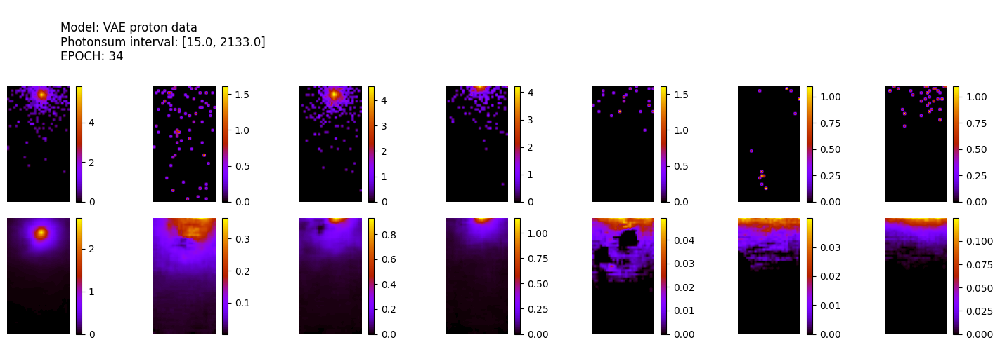

305/305 [==============================] - 1s 4ms/step
ws mean 29.75 ch1 0.02 ch2 7.07 ch3 0.28 ch4 67.12 ch5 74.26 Time for epoch 35 is 28.814438819885254 sec
10700 [Total loss: 45.29] [Recon_loss: 44.42] [KL loss: 1.25]
10800 [Total loss: 47.60] [Recon_loss: 46.63] [KL loss: 1.39]
10900 [Total loss: 30.94] [Recon_loss: 30.46] [KL loss: 0.69]


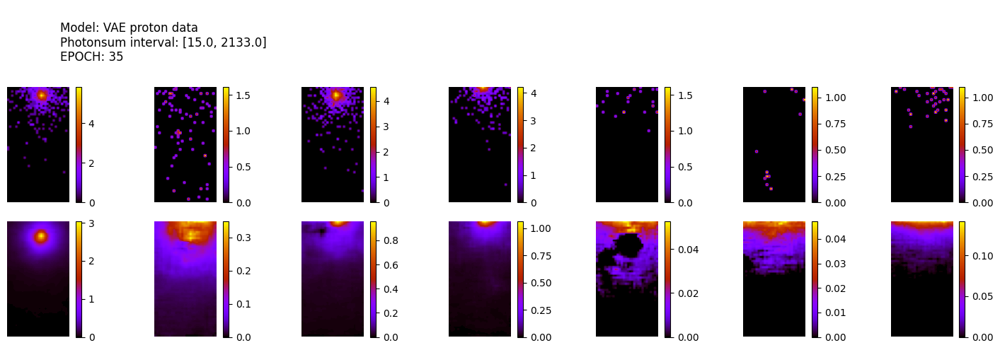

305/305 [==============================] - 1s 4ms/step
ws mean 27.31 ch1 0.02 ch2 6.56 ch3 0.24 ch4 61.63 ch5 68.12 Time for epoch 36 is 28.982755661010742 sec
11000 [Total loss: 43.72] [Recon_loss: 42.92] [KL loss: 1.14]
11100 [Total loss: 34.59] [Recon_loss: 33.97] [KL loss: 0.87]
11200 [Total loss: 34.36] [Recon_loss: 33.76] [KL loss: 0.86]


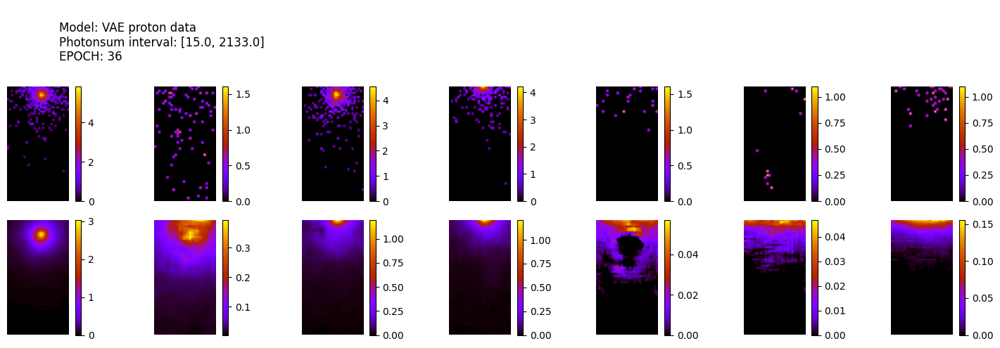

305/305 [==============================] - 1s 4ms/step
ws mean 26.47 ch1 0.02 ch2 6.70 ch3 0.27 ch4 59.27 ch5 66.07 Time for epoch 37 is 29.040822982788086 sec
11300 [Total loss: 41.29] [Recon_loss: 40.54] [KL loss: 1.08]
11400 [Total loss: 43.45] [Recon_loss: 42.57] [KL loss: 1.25]
11500 [Total loss: 42.47] [Recon_loss: 41.67] [KL loss: 1.15]


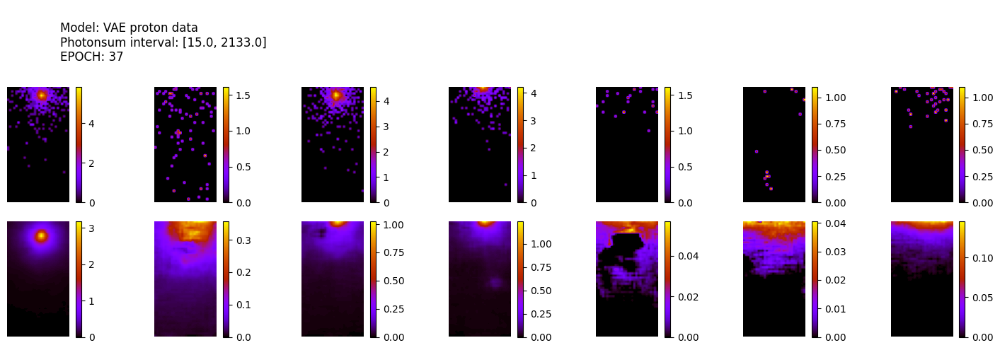

305/305 [==============================] - 1s 4ms/step
ws mean 27.71 ch1 0.02 ch2 6.32 ch3 0.26 ch4 62.91 ch5 69.03 Time for epoch 38 is 28.8936824798584 sec
11600 [Total loss: 38.22] [Recon_loss: 37.61] [KL loss: 0.88]
11700 [Total loss: 43.49] [Recon_loss: 42.62] [KL loss: 1.25]
11800 [Total loss: 44.21] [Recon_loss: 43.24] [KL loss: 1.38]


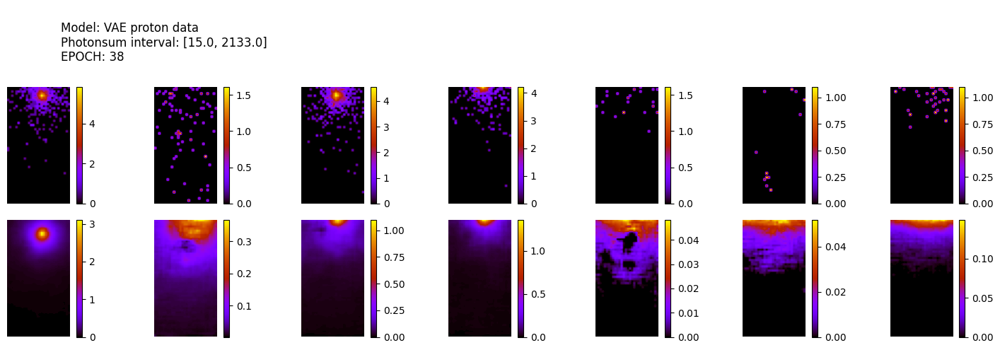

305/305 [==============================] - 1s 4ms/step
ws mean 28.15 ch1 0.02 ch2 6.56 ch3 0.22 ch4 63.71 ch5 70.23 Time for epoch 39 is 28.874836683273315 sec
11900 [Total loss: 36.53] [Recon_loss: 35.93] [KL loss: 0.85]
12000 [Total loss: 31.16] [Recon_loss: 30.67] [KL loss: 0.70]
12100 [Total loss: 42.12] [Recon_loss: 41.37] [KL loss: 1.07]
12200 [Total loss: 40.34] [Recon_loss: 39.51] [KL loss: 1.19]


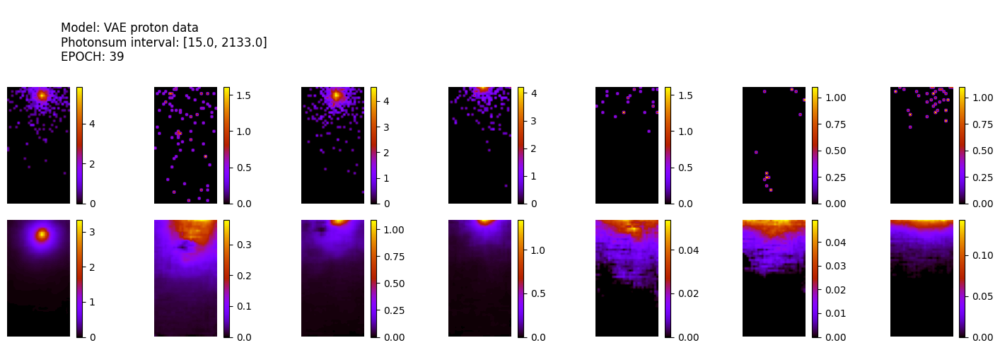

305/305 [==============================] - 1s 4ms/step
ws mean 26.73 ch1 0.02 ch2 6.16 ch3 0.23 ch4 60.54 ch5 66.72 Time for epoch 40 is 28.86036205291748 sec
12300 [Total loss: 39.29] [Recon_loss: 38.43] [KL loss: 1.23]
12400 [Total loss: 34.29] [Recon_loss: 33.71] [KL loss: 0.83]
12500 [Total loss: 42.24] [Recon_loss: 41.49] [KL loss: 1.08]


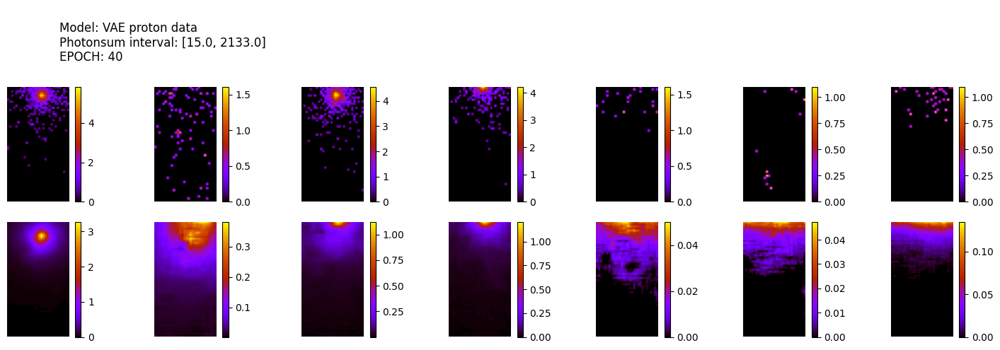

305/305 [==============================] - 1s 4ms/step
ws mean 25.03 ch1 0.02 ch2 6.47 ch3 0.23 ch4 55.91 ch5 62.54 Time for epoch 41 is 29.035823106765747 sec
12600 [Total loss: 45.17] [Recon_loss: 44.26] [KL loss: 1.30]
12700 [Total loss: 31.48] [Recon_loss: 31.04] [KL loss: 0.64]
12800 [Total loss: 38.64] [Recon_loss: 37.89] [KL loss: 1.07]


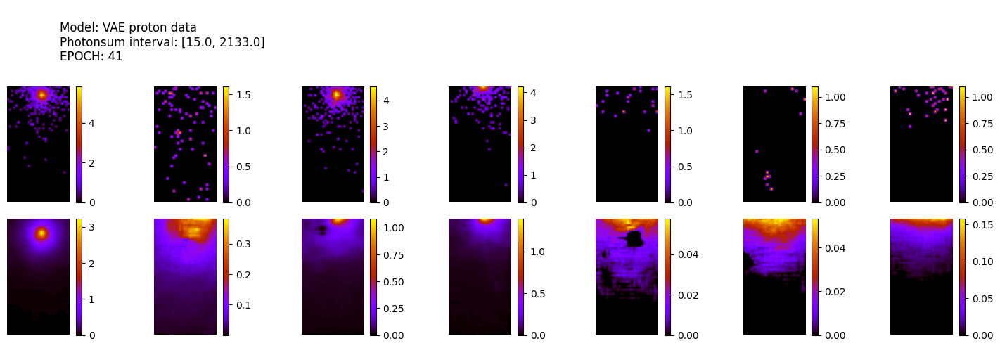

305/305 [==============================] - 1s 4ms/step
ws mean 24.90 ch1 0.02 ch2 5.79 ch3 0.24 ch4 56.46 ch5 61.98 Time for epoch 42 is 28.916094541549683 sec
12900 [Total loss: 45.27] [Recon_loss: 44.32] [KL loss: 1.36]
13000 [Total loss: 44.08] [Recon_loss: 43.22] [KL loss: 1.23]
13100 [Total loss: 45.58] [Recon_loss: 44.69] [KL loss: 1.27]


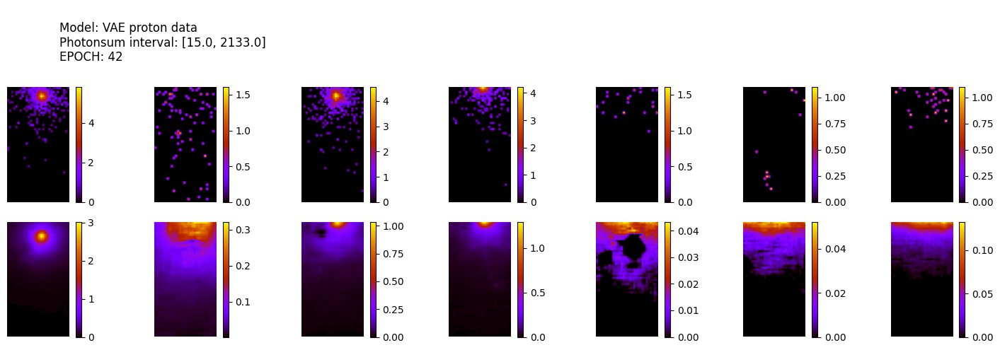

305/305 [==============================] - 1s 4ms/step
ws mean 28.90 ch1 0.02 ch2 6.90 ch3 0.29 ch4 65.10 ch5 72.19 Time for epoch 43 is 30.01722502708435 sec
13200 [Total loss: 30.02] [Recon_loss: 29.60] [KL loss: 0.60]
13300 [Total loss: 44.64] [Recon_loss: 43.78] [KL loss: 1.24]
13400 [Total loss: 37.03] [Recon_loss: 36.41] [KL loss: 0.88]


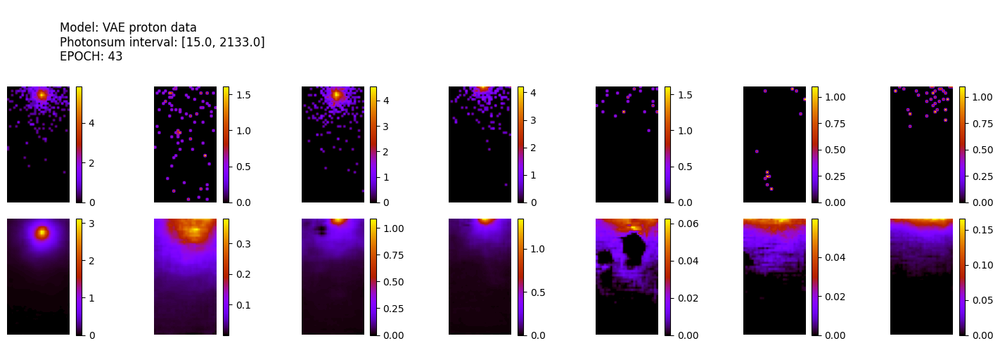

305/305 [==============================] - 1s 4ms/step
ws mean 26.36 ch1 0.02 ch2 5.18 ch3 0.26 ch4 60.72 ch5 65.61 Time for epoch 44 is 28.812330961227417 sec
13500 [Total loss: 35.49] [Recon_loss: 34.98] [KL loss: 0.72]
13600 [Total loss: 46.23] [Recon_loss: 45.39] [KL loss: 1.20]
13700 [Total loss: 47.09] [Recon_loss: 46.21] [KL loss: 1.26]


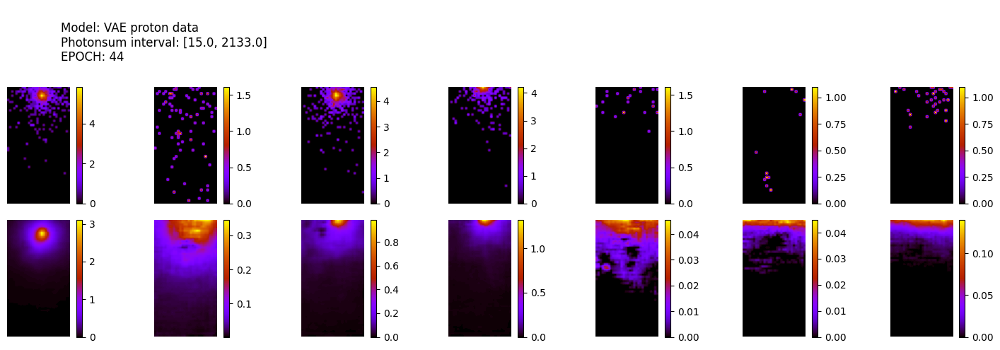

305/305 [==============================] - 1s 4ms/step
ws mean 28.20 ch1 0.02 ch2 6.89 ch3 0.26 ch4 63.48 ch5 70.37 Time for epoch 45 is 29.156700611114502 sec
13800 [Total loss: 41.20] [Recon_loss: 40.45] [KL loss: 1.08]
13900 [Total loss: 39.47] [Recon_loss: 38.79] [KL loss: 0.98]
14000 [Total loss: 34.30] [Recon_loss: 33.70] [KL loss: 0.87]


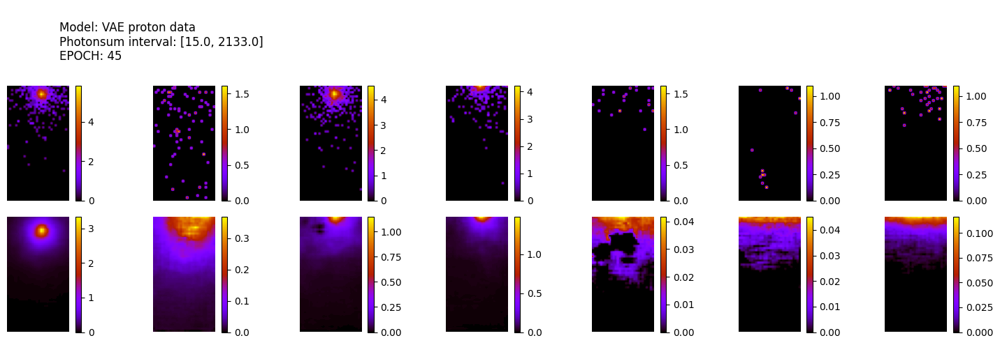

305/305 [==============================] - 1s 4ms/step
ws mean 26.48 ch1 0.02 ch2 6.37 ch3 0.27 ch4 59.63 ch5 66.13 Time for epoch 46 is 28.922840118408203 sec
14100 [Total loss: 39.83] [Recon_loss: 39.15] [KL loss: 0.97]
14200 [Total loss: 38.33] [Recon_loss: 37.81] [KL loss: 0.75]
14300 [Total loss: 42.83] [Recon_loss: 42.03] [KL loss: 1.13]


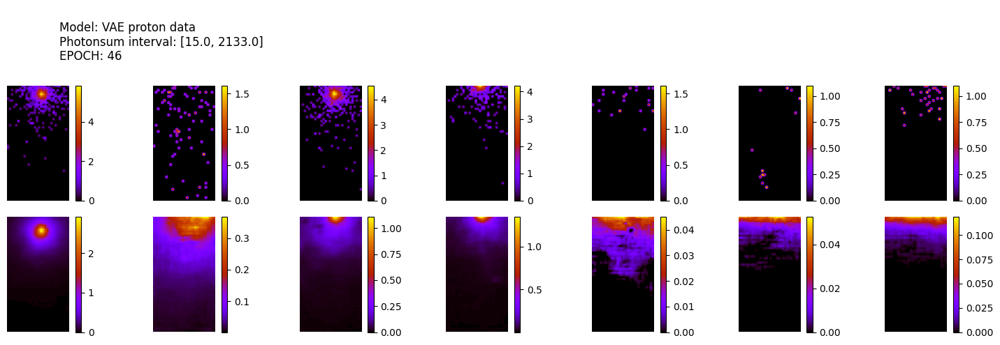

305/305 [==============================] - 1s 4ms/step
ws mean 27.59 ch1 0.02 ch2 6.98 ch3 0.26 ch4 61.89 ch5 68.82 Time for epoch 47 is 28.86458969116211 sec
14400 [Total loss: 38.89] [Recon_loss: 38.23] [KL loss: 0.95]
14500 [Total loss: 36.54] [Recon_loss: 35.91] [KL loss: 0.91]
14600 [Total loss: 38.32] [Recon_loss: 37.58] [KL loss: 1.06]


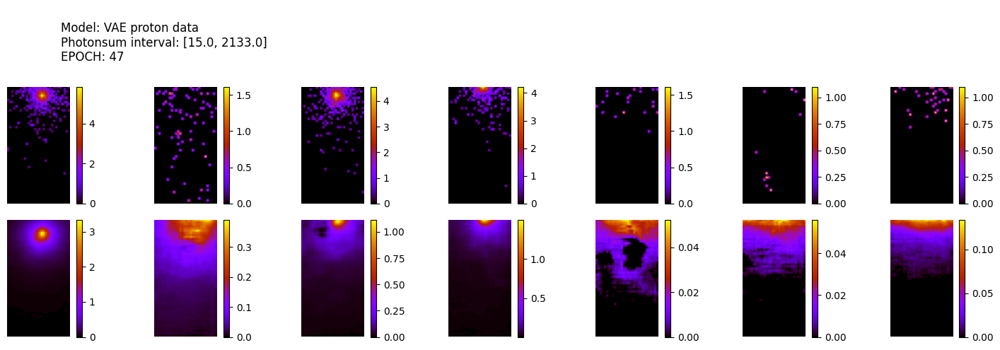

305/305 [==============================] - 1s 4ms/step
ws mean 24.04 ch1 0.02 ch2 5.76 ch3 0.26 ch4 54.28 ch5 59.85 Time for epoch 48 is 29.35264253616333 sec
14700 [Total loss: 36.27] [Recon_loss: 35.73] [KL loss: 0.77]
14800 [Total loss: 44.36] [Recon_loss: 43.55] [KL loss: 1.15]
14900 [Total loss: 39.41] [Recon_loss: 38.80] [KL loss: 0.87]


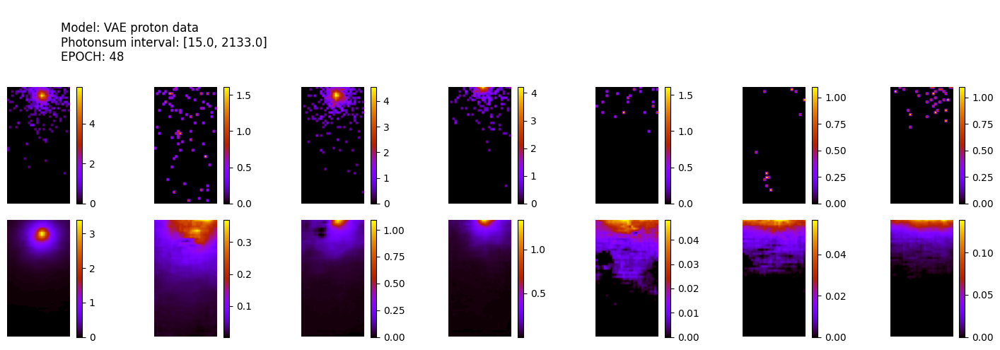

305/305 [==============================] - 1s 4ms/step
ws mean 24.21 ch1 0.02 ch2 6.28 ch3 0.23 ch4 54.12 ch5 60.38 Time for epoch 49 is 28.911627054214478 sec
15000 [Total loss: 42.38] [Recon_loss: 41.61] [KL loss: 1.10]
15100 [Total loss: 43.96] [Recon_loss: 43.13] [KL loss: 1.19]
15200 [Total loss: 43.06] [Recon_loss: 42.29] [KL loss: 1.11]


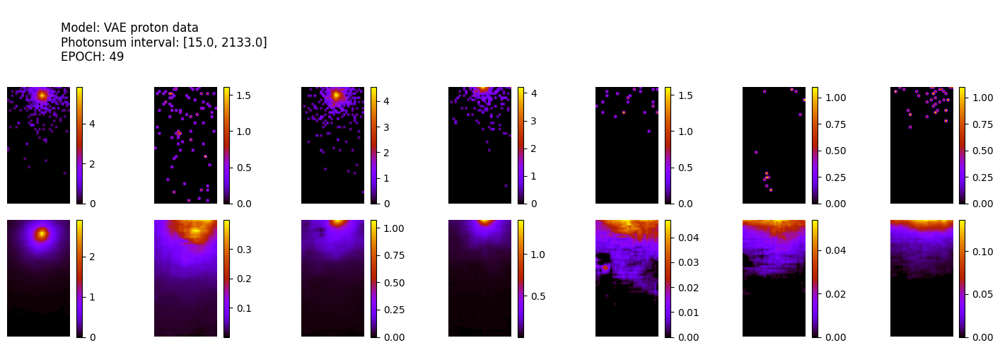

305/305 [==============================] - 1s 4ms/step
ws mean 25.27 ch1 0.02 ch2 5.81 ch3 0.25 ch4 57.23 ch5 63.00 Time for epoch 50 is 29.353913068771362 sec
15300 [Total loss: 38.60] [Recon_loss: 38.05] [KL loss: 0.79]
15400 [Total loss: 38.00] [Recon_loss: 37.35] [KL loss: 0.93]
15500 [Total loss: 35.24] [Recon_loss: 34.81] [KL loss: 0.61]


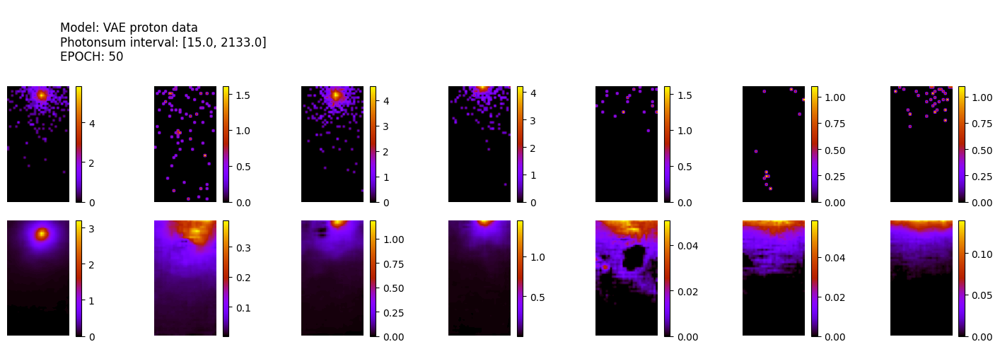

305/305 [==============================] - 1s 4ms/step
ws mean 9.72 ch1 0.01 ch2 5.58 ch3 0.15 ch4 18.48 ch5 24.37 Time for epoch 145 is 29.183313131332397 sec
44300 [Total loss: 41.33] [Recon_loss: 40.97] [KL loss: 0.50]
44400 [Total loss: 43.00] [Recon_loss: 42.63] [KL loss: 0.53]
44500 [Total loss: 40.55] [Recon_loss: 40.18] [KL loss: 0.53]


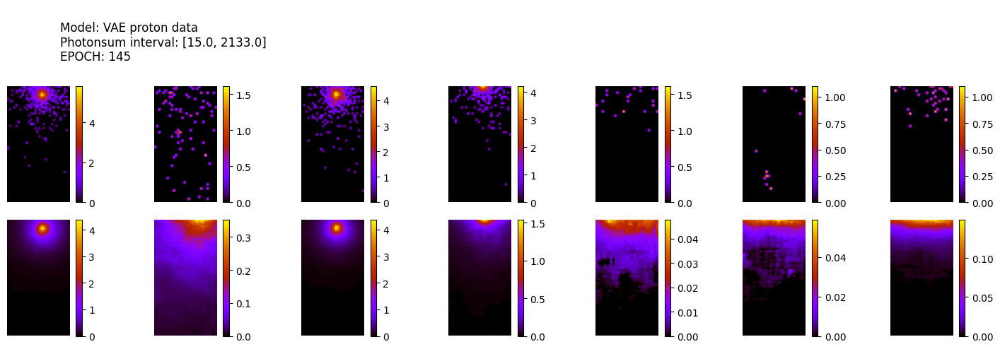

305/305 [==============================] - 1s 4ms/step
ws mean 13.66 ch1 0.02 ch2 6.20 ch3 0.15 ch4 27.76 ch5 34.16 Time for epoch 146 is 29.74796748161316 sec
44600 [Total loss: 38.94] [Recon_loss: 38.66] [KL loss: 0.41]
44700 [Total loss: 32.82] [Recon_loss: 32.62] [KL loss: 0.28]
44800 [Total loss: 33.38] [Recon_loss: 33.18] [KL loss: 0.28]


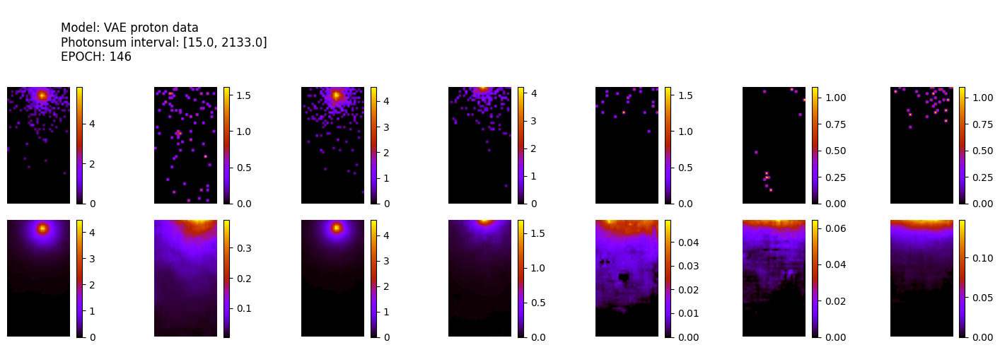

305/305 [==============================] - 1s 4ms/step
ws mean 12.48 ch1 0.02 ch2 5.59 ch3 0.15 ch4 25.59 ch5 31.05 Time for epoch 147 is 29.40883994102478 sec
44900 [Total loss: 36.69] [Recon_loss: 36.44] [KL loss: 0.36]
45000 [Total loss: 39.35] [Recon_loss: 38.87] [KL loss: 0.69]
45100 [Total loss: 40.85] [Recon_loss: 40.53] [KL loss: 0.47]


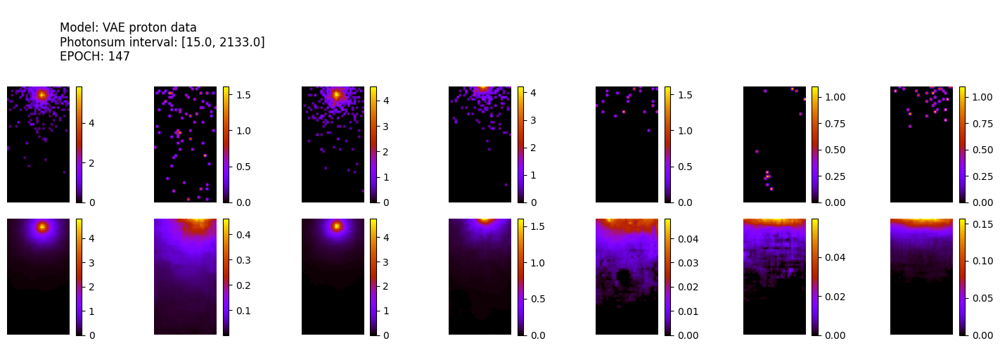

305/305 [==============================] - 1s 4ms/step
ws mean 8.31 ch1 0.01 ch2 5.77 ch3 0.13 ch4 14.88 ch5 20.78 Time for epoch 148 is 29.48983860015869 sec
45200 [Total loss: 37.33] [Recon_loss: 37.06] [KL loss: 0.38]
45300 [Total loss: 35.66] [Recon_loss: 35.37] [KL loss: 0.42]
45400 [Total loss: 37.49] [Recon_loss: 37.18] [KL loss: 0.45]


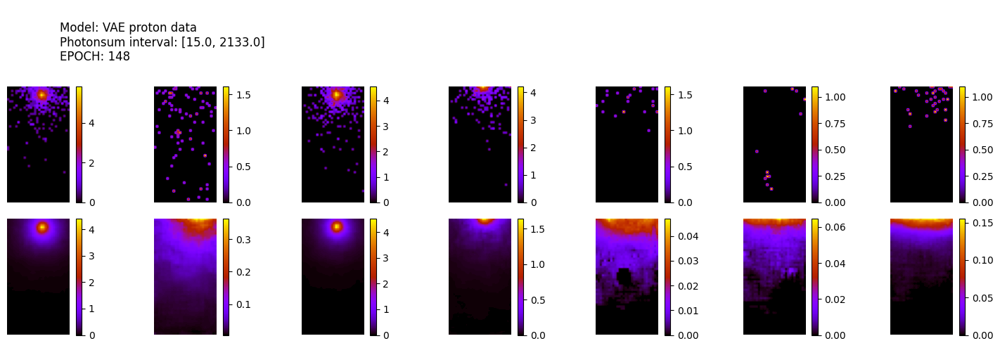

305/305 [==============================] - 1s 4ms/step
ws mean 13.53 ch1 0.01 ch2 5.49 ch3 0.15 ch4 28.27 ch5 33.74 Time for epoch 149 is 29.79414677619934 sec
45500 [Total loss: 36.60] [Recon_loss: 36.24] [KL loss: 0.51]
45600 [Total loss: 41.07] [Recon_loss: 40.65] [KL loss: 0.60]
45700 [Total loss: 37.77] [Recon_loss: 37.43] [KL loss: 0.48]


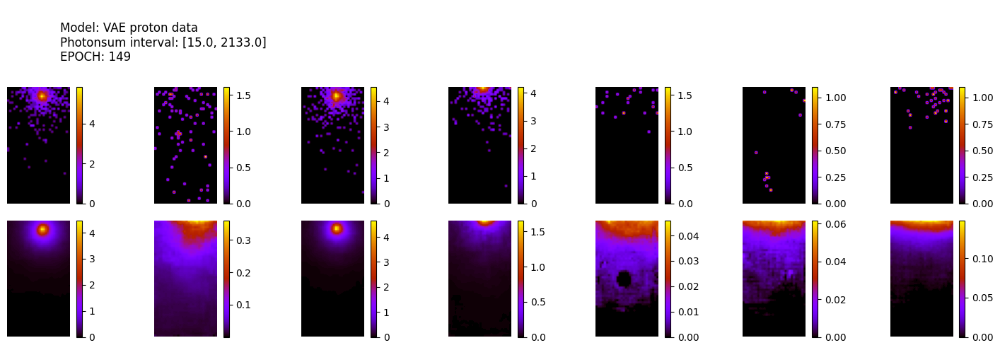

305/305 [==============================] - 1s 4ms/step
ws mean 9.63 ch1 0.01 ch2 5.32 ch3 0.13 ch4 18.62 ch5 24.05 Time for epoch 150 is 29.215523958206177 sec
45800 [Total loss: 42.96] [Recon_loss: 42.40] [KL loss: 0.79]
45900 [Total loss: 41.75] [Recon_loss: 41.23] [KL loss: 0.74]
46000 [Total loss: 33.31] [Recon_loss: 33.12] [KL loss: 0.27]


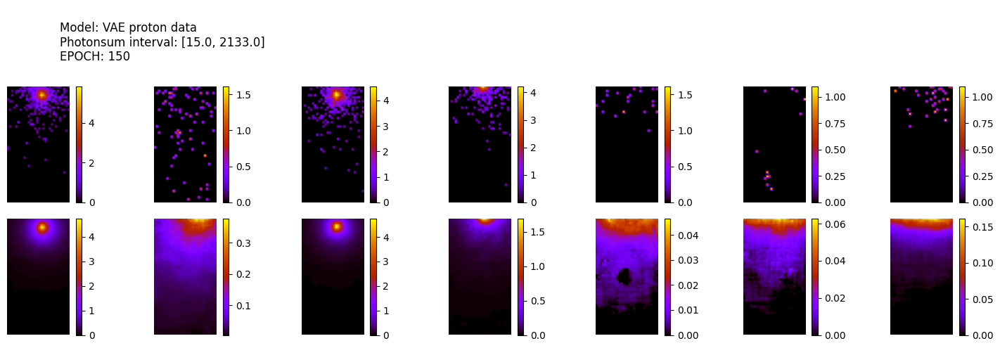

305/305 [==============================] - 1s 4ms/step
ws mean 10.00 ch1 0.01 ch2 5.50 ch3 0.13 ch4 19.42 ch5 24.95 Time for epoch 151 is 29.56379508972168 sec
46100 [Total loss: 43.34] [Recon_loss: 42.78] [KL loss: 0.80]
46200 [Total loss: 42.04] [Recon_loss: 41.66] [KL loss: 0.54]
46300 [Total loss: 41.16] [Recon_loss: 40.75] [KL loss: 0.59]


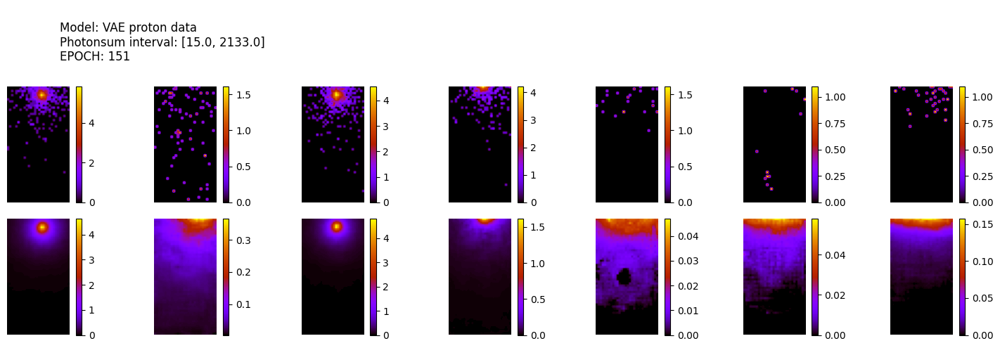

305/305 [==============================] - 1s 4ms/step
ws mean 10.98 ch1 0.01 ch2 5.55 ch3 0.14 ch4 21.85 ch5 27.36 Time for epoch 152 is 29.599746227264404 sec
46400 [Total loss: 43.70] [Recon_loss: 43.02] [KL loss: 0.97]
46500 [Total loss: 37.97] [Recon_loss: 37.64] [KL loss: 0.48]
46600 [Total loss: 45.43] [Recon_loss: 44.89] [KL loss: 0.77]


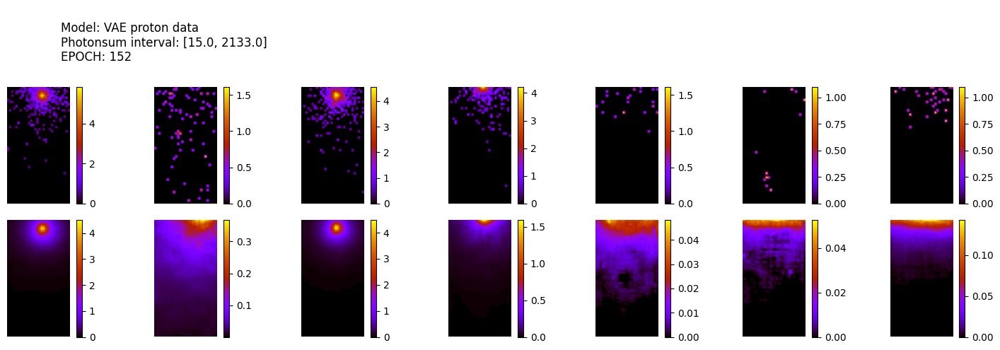

305/305 [==============================] - 1s 4ms/step
ws mean 15.82 ch1 0.02 ch2 6.47 ch3 0.17 ch4 32.99 ch5 39.46 Time for epoch 153 is 29.8229501247406 sec
46700 [Total loss: 45.47] [Recon_loss: 45.07] [KL loss: 0.58]
46800 [Total loss: 41.77] [Recon_loss: 41.32] [KL loss: 0.64]
46900 [Total loss: 38.42] [Recon_loss: 38.10] [KL loss: 0.46]


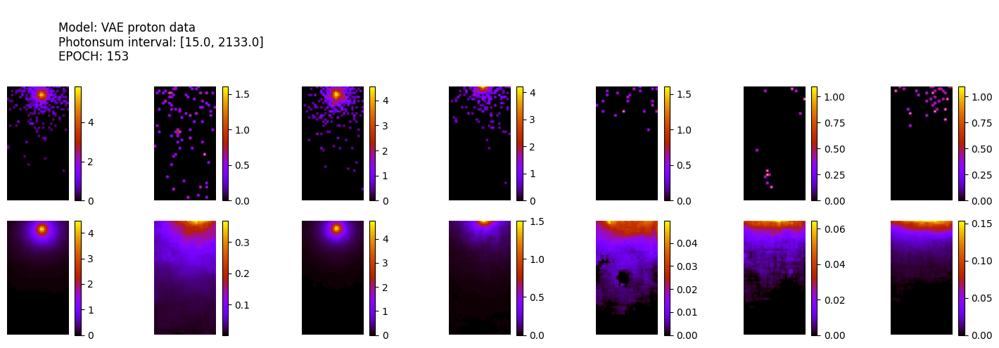

305/305 [==============================] - 1s 4ms/step
ws mean 13.31 ch1 0.02 ch2 5.94 ch3 0.17 ch4 27.29 ch5 33.14 Time for epoch 154 is 29.247630834579468 sec
47000 [Total loss: 35.61] [Recon_loss: 35.35] [KL loss: 0.38]
47100 [Total loss: 41.00] [Recon_loss: 40.56] [KL loss: 0.63]
47200 [Total loss: 43.24] [Recon_loss: 42.87] [KL loss: 0.53]


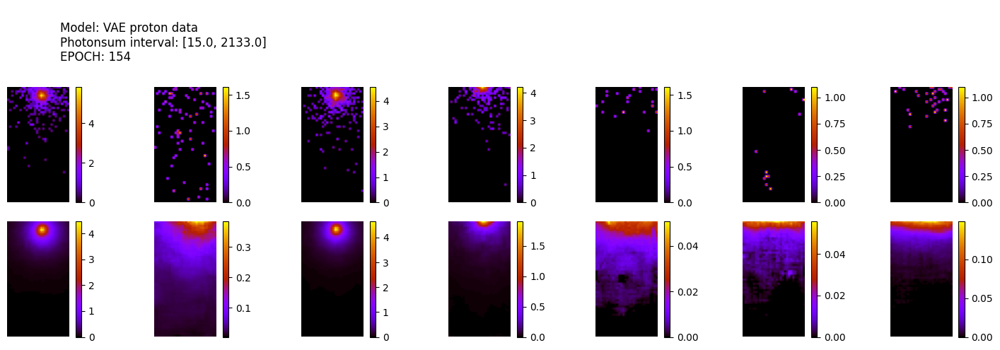

305/305 [==============================] - 1s 4ms/step
ws mean 10.33 ch1 0.01 ch2 5.50 ch3 0.13 ch4 20.20 ch5 25.79 Time for epoch 155 is 29.409578323364258 sec
47300 [Total loss: 40.21] [Recon_loss: 39.71] [KL loss: 0.71]
47400 [Total loss: 40.49] [Recon_loss: 40.07] [KL loss: 0.60]
47500 [Total loss: 33.64] [Recon_loss: 33.36] [KL loss: 0.39]


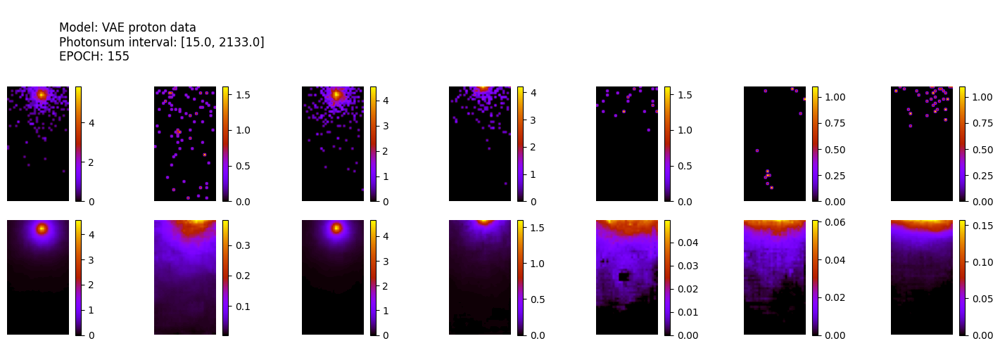

305/305 [==============================] - 1s 4ms/step
ws mean 11.20 ch1 0.01 ch2 5.38 ch3 0.13 ch4 22.62 ch5 27.86 Time for epoch 156 is 29.772199153900146 sec
47600 [Total loss: 43.49] [Recon_loss: 43.07] [KL loss: 0.61]
47700 [Total loss: 38.58] [Recon_loss: 38.04] [KL loss: 0.78]
47800 [Total loss: 43.25] [Recon_loss: 42.75] [KL loss: 0.71]


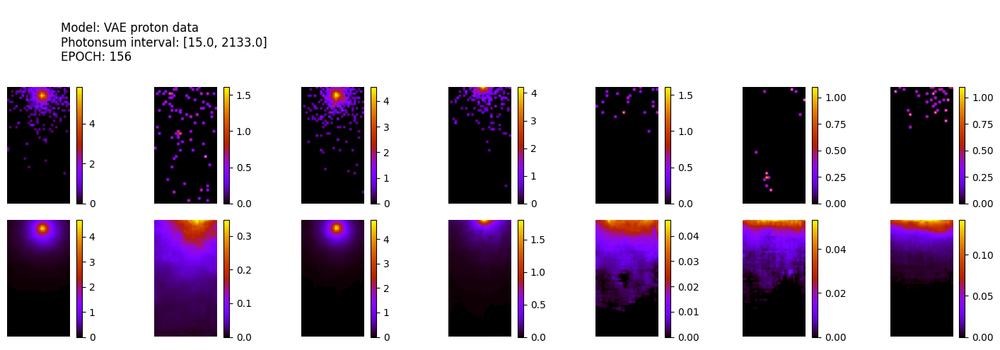

305/305 [==============================] - 1s 4ms/step
ws mean 11.97 ch1 0.02 ch2 5.85 ch3 0.13 ch4 23.94 ch5 29.93 Time for epoch 157 is 29.282344341278076 sec
47900 [Total loss: 36.16] [Recon_loss: 35.61] [KL loss: 0.79]
48000 [Total loss: 42.53] [Recon_loss: 42.04] [KL loss: 0.70]
48100 [Total loss: 40.66] [Recon_loss: 40.29] [KL loss: 0.54]


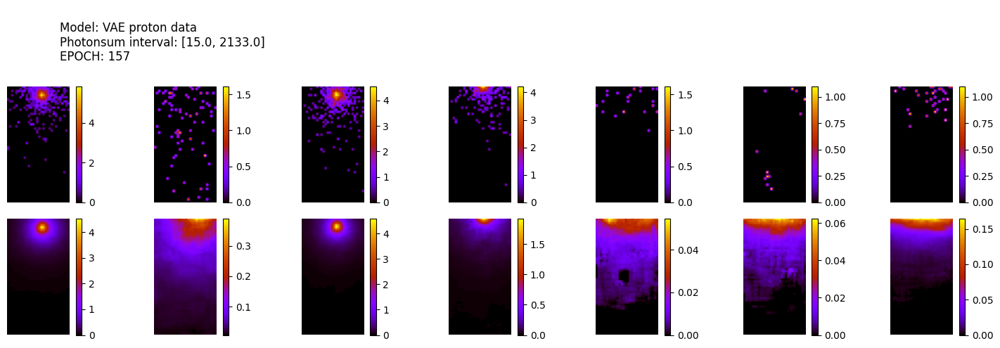

305/305 [==============================] - 1s 4ms/step
ws mean 11.42 ch1 0.01 ch2 4.91 ch3 0.15 ch4 23.63 ch5 28.39 Time for epoch 158 is 29.70719289779663 sec
48200 [Total loss: 31.88] [Recon_loss: 31.70] [KL loss: 0.26]
48300 [Total loss: 39.64] [Recon_loss: 39.21] [KL loss: 0.61]
48400 [Total loss: 39.55] [Recon_loss: 39.08] [KL loss: 0.67]


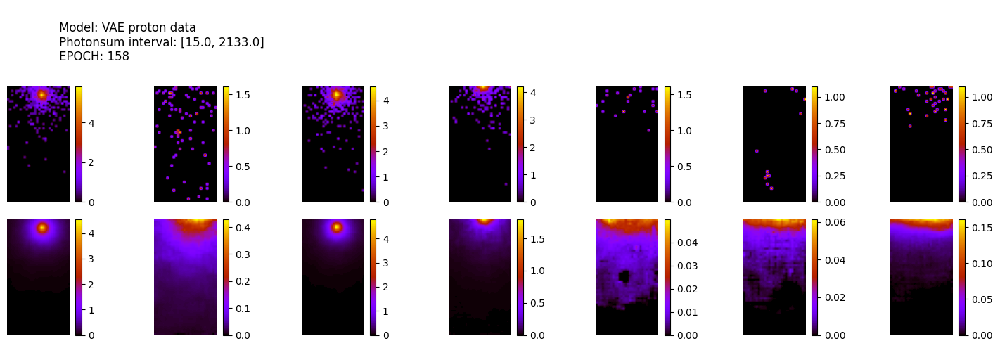

305/305 [==============================] - 1s 4ms/step
ws mean 10.85 ch1 0.01 ch2 5.46 ch3 0.14 ch4 21.59 ch5 27.05 Time for epoch 159 is 29.569214582443237 sec
48500 [Total loss: 40.83] [Recon_loss: 40.47] [KL loss: 0.52]
48600 [Total loss: 42.95] [Recon_loss: 42.32] [KL loss: 0.90]
48700 [Total loss: 48.20] [Recon_loss: 47.54] [KL loss: 0.95]
48800 [Total loss: 41.83] [Recon_loss: 41.39] [KL loss: 0.63]


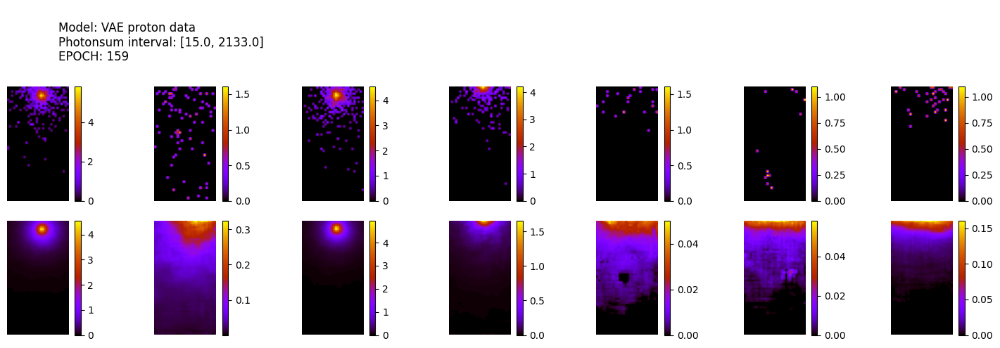

305/305 [==============================] - 1s 4ms/step
ws mean 12.50 ch1 0.01 ch2 5.40 ch3 0.13 ch4 25.84 ch5 31.10 Time for epoch 160 is 29.899952173233032 sec
48900 [Total loss: 42.28] [Recon_loss: 42.00] [KL loss: 0.40]
49000 [Total loss: 44.82] [Recon_loss: 44.43] [KL loss: 0.56]
49100 [Total loss: 45.93] [Recon_loss: 45.35] [KL loss: 0.83]


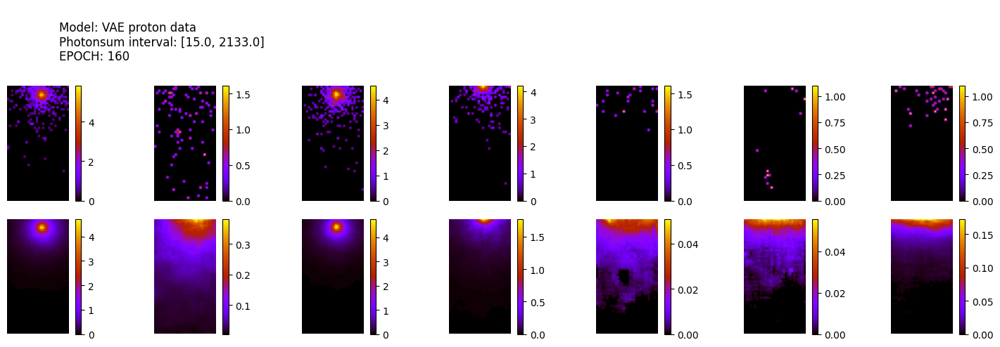

305/305 [==============================] - 1s 4ms/step
ws mean 10.84 ch1 0.01 ch2 5.54 ch3 0.16 ch4 21.48 ch5 27.02 Time for epoch 161 is 29.265515327453613 sec
49200 [Total loss: 42.35] [Recon_loss: 41.90] [KL loss: 0.65]
49300 [Total loss: 41.88] [Recon_loss: 41.53] [KL loss: 0.50]
49400 [Total loss: 35.90] [Recon_loss: 35.65] [KL loss: 0.35]


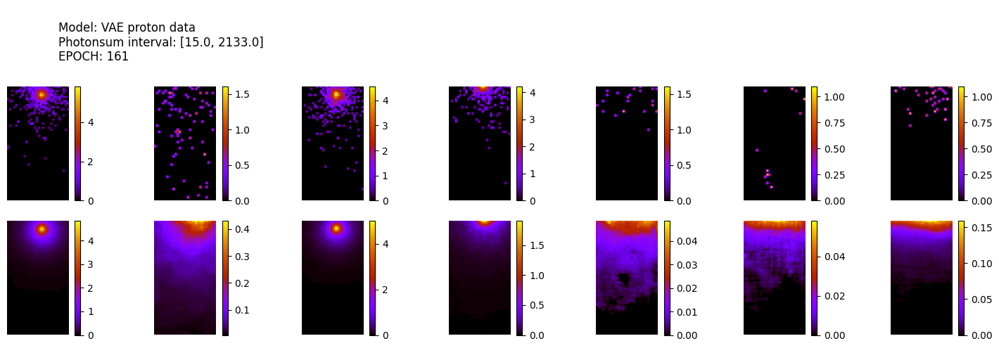

305/305 [==============================] - 1s 4ms/step
ws mean 6.53 ch1 0.01 ch2 5.24 ch3 0.11 ch4 11.11 ch5 16.17 Time for epoch 162 is 29.52293038368225 sec
49500 [Total loss: 37.54] [Recon_loss: 37.24] [KL loss: 0.43]
49600 [Total loss: 42.51] [Recon_loss: 42.00] [KL loss: 0.74]
49700 [Total loss: 38.38] [Recon_loss: 38.14] [KL loss: 0.35]


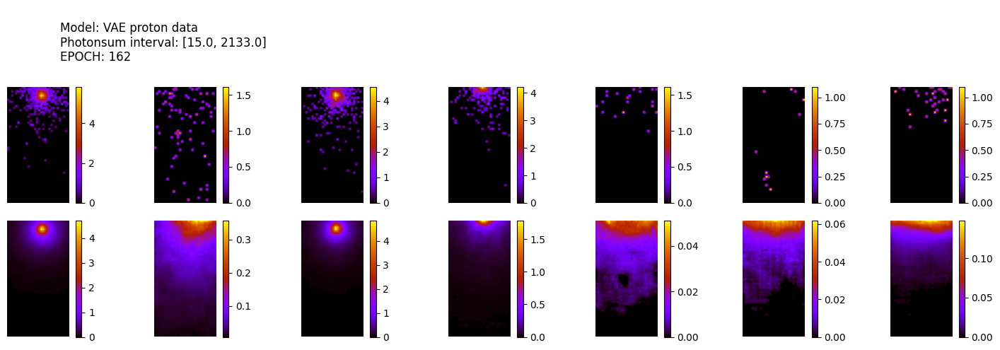

305/305 [==============================] - 1s 4ms/step
ws mean 11.00 ch1 0.01 ch2 5.36 ch3 0.11 ch4 22.08 ch5 27.42 Time for epoch 163 is 29.73551869392395 sec
49800 [Total loss: 33.27] [Recon_loss: 32.97] [KL loss: 0.43]
49900 [Total loss: 39.14] [Recon_loss: 38.79] [KL loss: 0.50]
50000 [Total loss: 41.88] [Recon_loss: 41.47] [KL loss: 0.59]


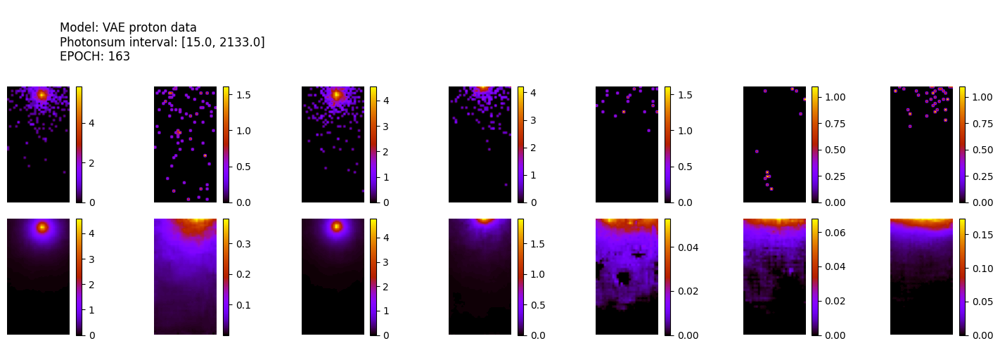

305/305 [==============================] - 1s 4ms/step
ws mean 11.69 ch1 0.01 ch2 5.39 ch3 0.13 ch4 23.77 ch5 29.13 Time for epoch 164 is 29.527095794677734 sec
50100 [Total loss: 38.90] [Recon_loss: 38.63] [KL loss: 0.38]
50200 [Total loss: 36.50] [Recon_loss: 36.20] [KL loss: 0.43]
50300 [Total loss: 47.65] [Recon_loss: 46.93] [KL loss: 1.02]


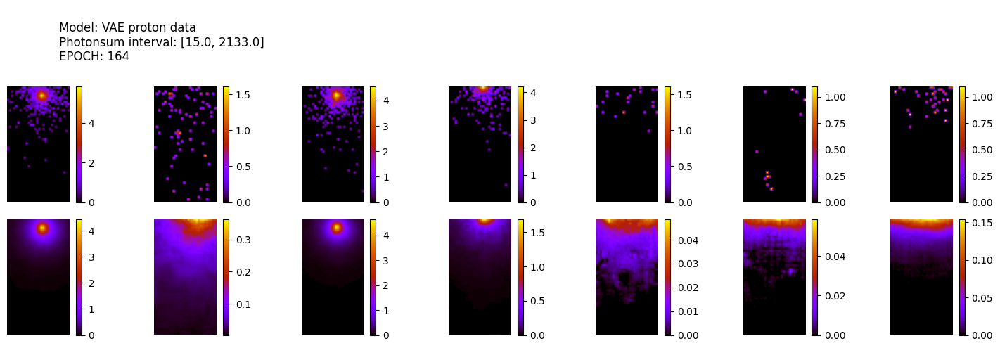

305/305 [==============================] - 1s 4ms/step
ws mean 12.68 ch1 0.02 ch2 6.25 ch3 0.14 ch4 25.32 ch5 31.70 Time for epoch 165 is 29.785372972488403 sec
50400 [Total loss: 39.46] [Recon_loss: 39.01] [KL loss: 0.63]
50500 [Total loss: 41.42] [Recon_loss: 40.97] [KL loss: 0.64]
50600 [Total loss: 43.42] [Recon_loss: 42.96] [KL loss: 0.66]


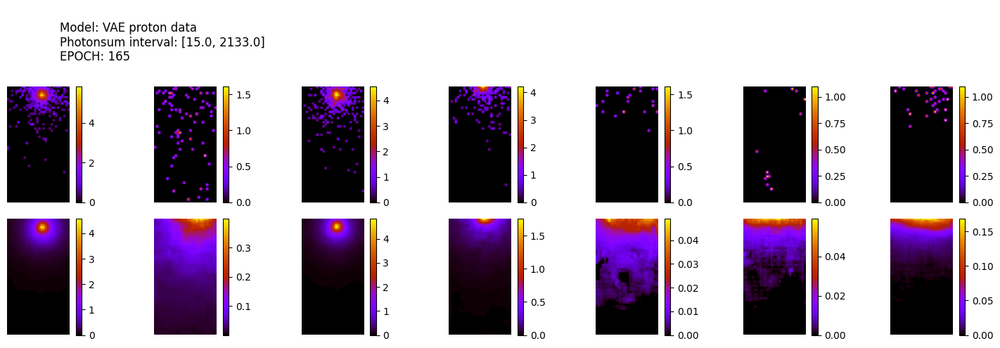

305/305 [==============================] - 1s 4ms/step
ws mean 9.78 ch1 0.01 ch2 5.41 ch3 0.15 ch4 18.89 ch5 24.44 Time for epoch 166 is 29.5171058177948 sec
50700 [Total loss: 35.18] [Recon_loss: 34.92] [KL loss: 0.37]
50800 [Total loss: 38.06] [Recon_loss: 37.66] [KL loss: 0.57]
50900 [Total loss: 38.91] [Recon_loss: 38.64] [KL loss: 0.38]


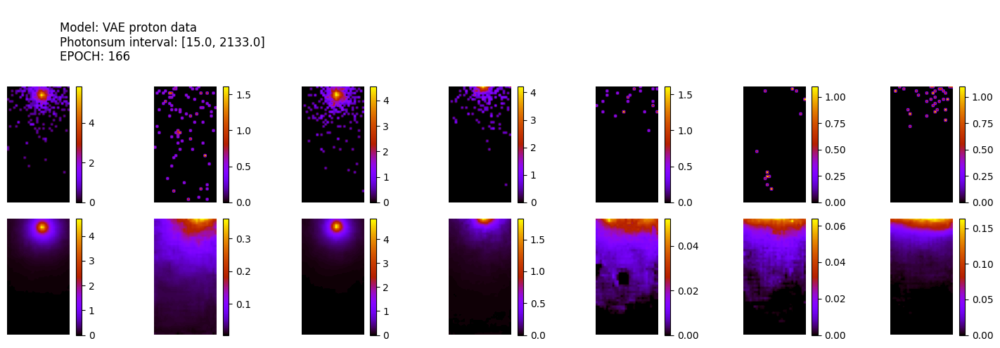

305/305 [==============================] - 1s 4ms/step
ws mean 9.18 ch1 0.01 ch2 4.86 ch3 0.11 ch4 18.08 ch5 22.84 Time for epoch 167 is 29.808491706848145 sec
51000 [Total loss: 37.36] [Recon_loss: 37.02] [KL loss: 0.48]
51100 [Total loss: 42.25] [Recon_loss: 41.66] [KL loss: 0.85]
51200 [Total loss: 43.36] [Recon_loss: 43.01] [KL loss: 0.49]


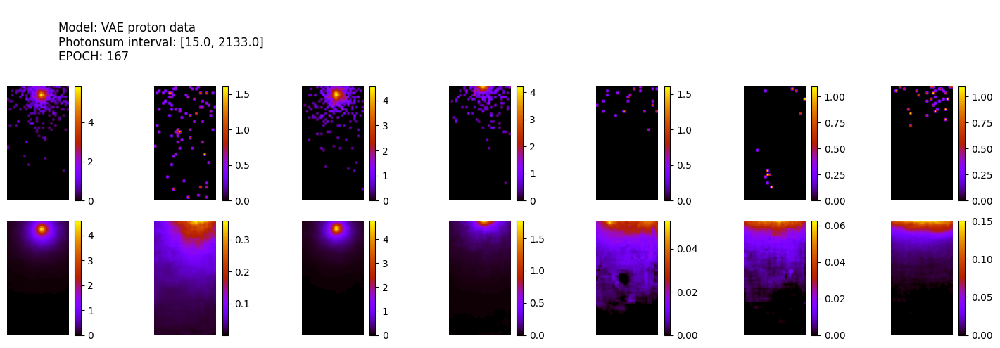

305/305 [==============================] - 1s 4ms/step
ws mean 10.50 ch1 0.01 ch2 5.10 ch3 0.15 ch4 21.09 ch5 26.16 Time for epoch 168 is 29.76066017150879 sec
51300 [Total loss: 45.11] [Recon_loss: 44.75] [KL loss: 0.51]
51400 [Total loss: 42.90] [Recon_loss: 42.57] [KL loss: 0.47]
51500 [Total loss: 34.62] [Recon_loss: 34.32] [KL loss: 0.43]


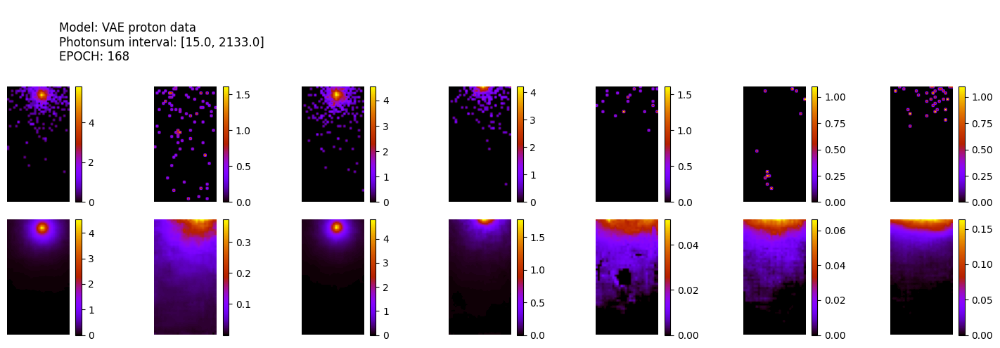

305/305 [==============================] - 1s 4ms/step
ws mean 11.70 ch1 0.02 ch2 5.53 ch3 0.14 ch4 23.75 ch5 29.08 Time for epoch 169 is 29.884427309036255 sec
51600 [Total loss: 43.19] [Recon_loss: 42.73] [KL loss: 0.65]
51700 [Total loss: 44.64] [Recon_loss: 44.26] [KL loss: 0.55]
51800 [Total loss: 29.64] [Recon_loss: 29.42] [KL loss: 0.31]


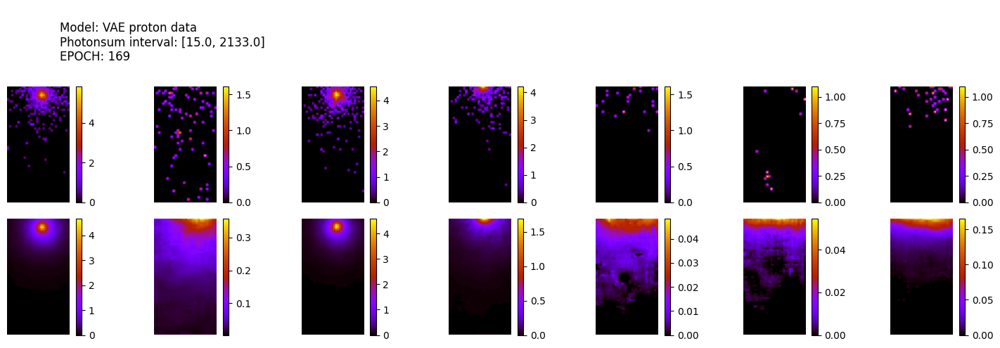

305/305 [==============================] - 1s 4ms/step
ws mean 11.66 ch1 0.01 ch2 5.84 ch3 0.14 ch4 23.19 ch5 29.13 Time for epoch 170 is 29.63237953186035 sec
51900 [Total loss: 32.63] [Recon_loss: 32.43] [KL loss: 0.28]
52000 [Total loss: 43.40] [Recon_loss: 42.98] [KL loss: 0.61]
52100 [Total loss: 33.60] [Recon_loss: 33.34] [KL loss: 0.36]


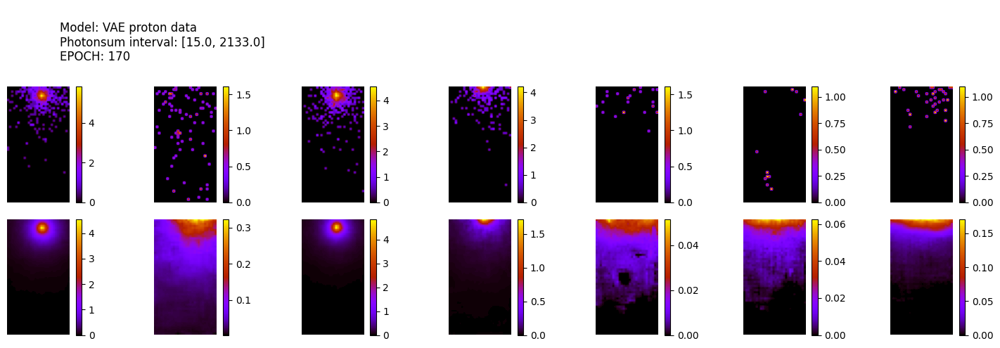

305/305 [==============================] - 1s 4ms/step
ws mean 12.06 ch1 0.01 ch2 5.67 ch3 0.14 ch4 24.41 ch5 30.07 Time for epoch 171 is 30.24710750579834 sec
52200 [Total loss: 36.36] [Recon_loss: 36.08] [KL loss: 0.39]
52300 [Total loss: 44.01] [Recon_loss: 43.65] [KL loss: 0.50]
52400 [Total loss: 44.09] [Recon_loss: 43.60] [KL loss: 0.70]


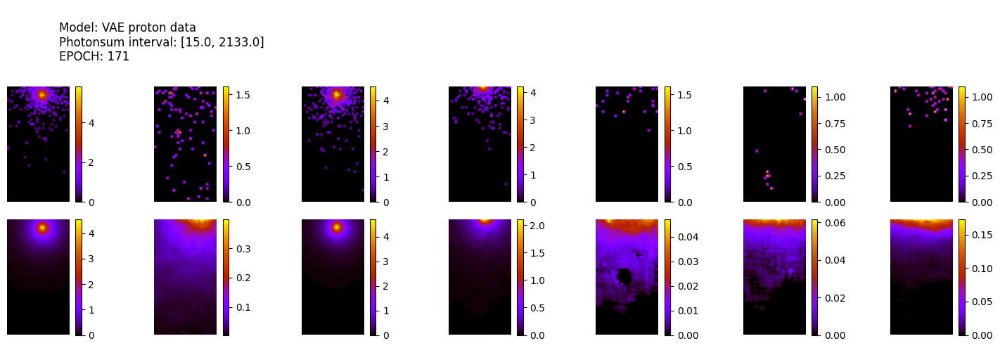

305/305 [==============================] - 1s 4ms/step
ws mean 11.50 ch1 0.01 ch2 5.90 ch3 0.12 ch4 22.76 ch5 28.72 Time for epoch 172 is 29.717225790023804 sec
52500 [Total loss: 43.49] [Recon_loss: 42.95] [KL loss: 0.76]
52600 [Total loss: 36.91] [Recon_loss: 36.63] [KL loss: 0.41]
52700 [Total loss: 32.64] [Recon_loss: 32.40] [KL loss: 0.34]


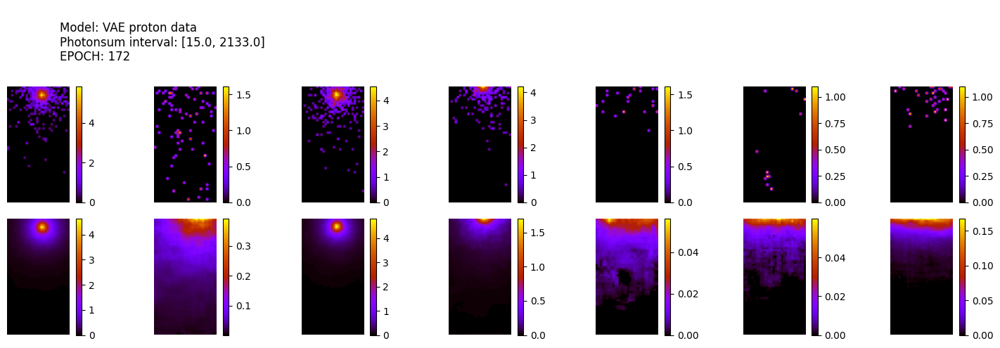

305/305 [==============================] - 1s 4ms/step
ws mean 10.23 ch1 0.01 ch2 5.81 ch3 0.09 ch4 19.65 ch5 25.57 Time for epoch 173 is 29.77259111404419 sec
52800 [Total loss: 33.13] [Recon_loss: 32.92] [KL loss: 0.30]
52900 [Total loss: 33.54] [Recon_loss: 33.22] [KL loss: 0.46]
53000 [Total loss: 38.54] [Recon_loss: 38.09] [KL loss: 0.65]


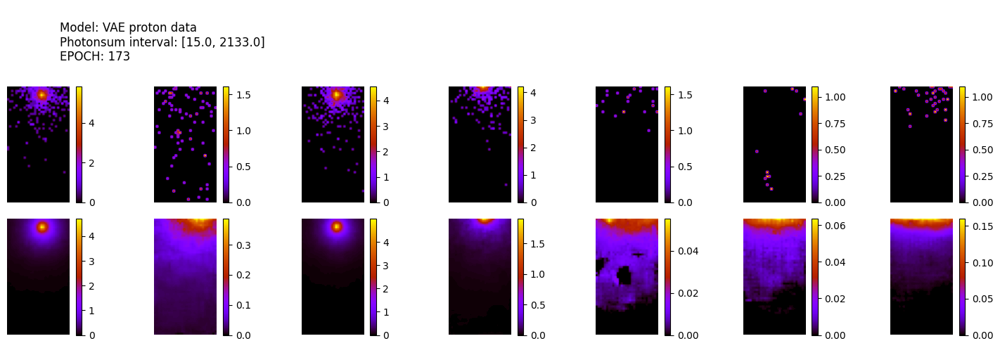

305/305 [==============================] - 1s 4ms/step
ws mean 9.55 ch1 0.01 ch2 5.12 ch3 0.12 ch4 18.88 ch5 23.63 Time for epoch 174 is 30.179579496383667 sec
53100 [Total loss: 37.05] [Recon_loss: 36.80] [KL loss: 0.36]
53200 [Total loss: 47.37] [Recon_loss: 46.56] [KL loss: 1.15]
53300 [Total loss: 41.72] [Recon_loss: 41.32] [KL loss: 0.58]


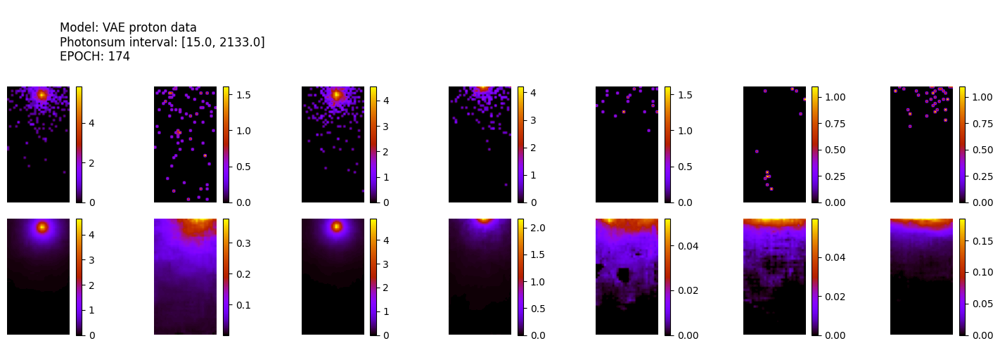

305/305 [==============================] - 1s 4ms/step
ws mean 9.79 ch1 0.01 ch2 5.54 ch3 0.13 ch4 18.78 ch5 24.47 Time for epoch 175 is 29.997509002685547 sec
53400 [Total loss: 42.27] [Recon_loss: 41.85] [KL loss: 0.61]
53500 [Total loss: 38.90] [Recon_loss: 38.69] [KL loss: 0.30]
53600 [Total loss: 33.64] [Recon_loss: 33.38] [KL loss: 0.37]


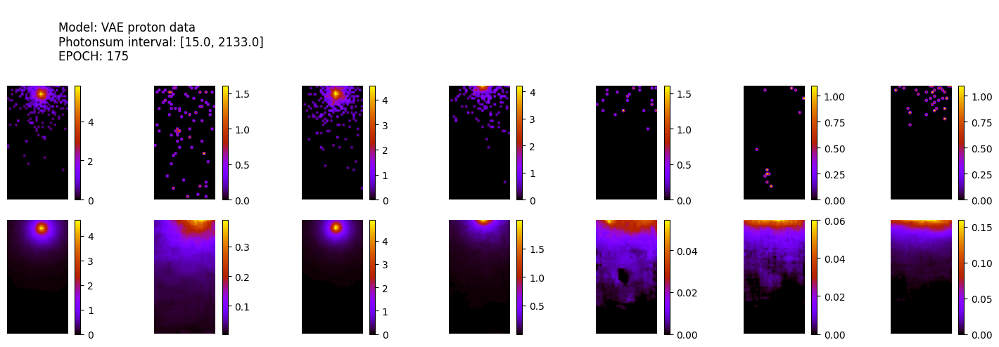

305/305 [==============================] - 1s 4ms/step
ws mean 11.22 ch1 0.01 ch2 5.78 ch3 0.14 ch4 22.20 ch5 27.99 Time for epoch 176 is 29.8055636882782 sec
53700 [Total loss: 43.08] [Recon_loss: 42.79] [KL loss: 0.42]
53800 [Total loss: 43.08] [Recon_loss: 42.65] [KL loss: 0.61]
53900 [Total loss: 38.46] [Recon_loss: 38.18] [KL loss: 0.40]


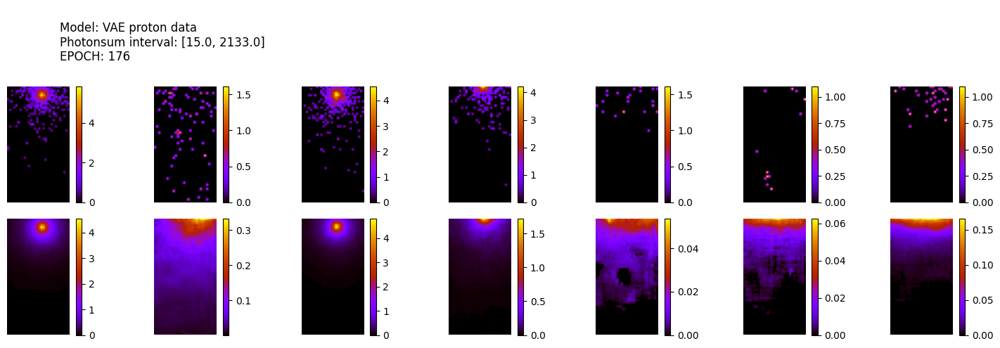

305/305 [==============================] - 1s 4ms/step
ws mean 12.35 ch1 0.01 ch2 5.73 ch3 0.16 ch4 24.99 ch5 30.84 Time for epoch 177 is 29.808707237243652 sec
54000 [Total loss: 33.56] [Recon_loss: 33.34] [KL loss: 0.31]
54100 [Total loss: 38.08] [Recon_loss: 37.80] [KL loss: 0.41]
54200 [Total loss: 39.85] [Recon_loss: 39.44] [KL loss: 0.58]


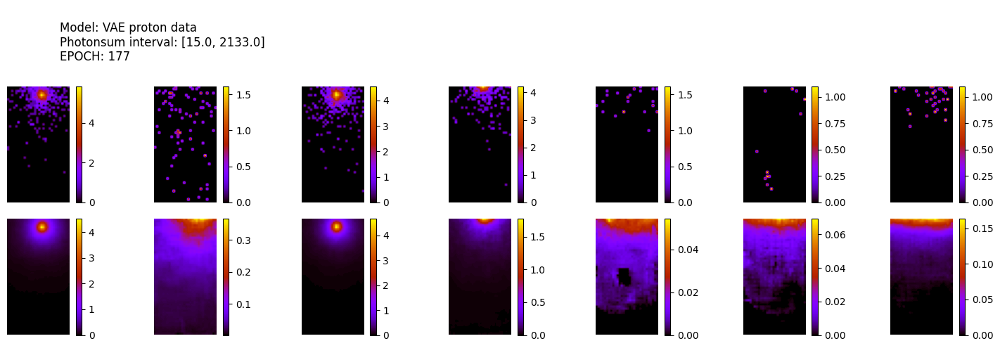

305/305 [==============================] - 1s 4ms/step
ws mean 13.13 ch1 0.01 ch2 5.00 ch3 0.15 ch4 27.92 ch5 32.58 Time for epoch 178 is 29.873462915420532 sec
54300 [Total loss: 43.95] [Recon_loss: 43.53] [KL loss: 0.60]
54400 [Total loss: 43.89] [Recon_loss: 43.36] [KL loss: 0.76]
54500 [Total loss: 45.75] [Recon_loss: 45.38] [KL loss: 0.53]


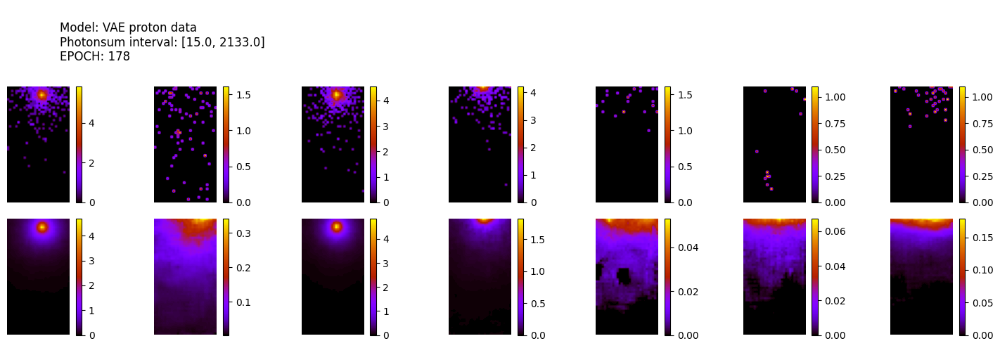

305/305 [==============================] - 1s 4ms/step
ws mean 10.88 ch1 0.01 ch2 5.08 ch3 0.14 ch4 22.02 ch5 27.13 Time for epoch 179 is 29.788625478744507 sec
54600 [Total loss: 44.46] [Recon_loss: 43.98] [KL loss: 0.68]
54700 [Total loss: 42.20] [Recon_loss: 41.70] [KL loss: 0.71]
54800 [Total loss: 35.47] [Recon_loss: 35.16] [KL loss: 0.44]
54900 [Total loss: 37.70] [Recon_loss: 37.25] [KL loss: 0.65]


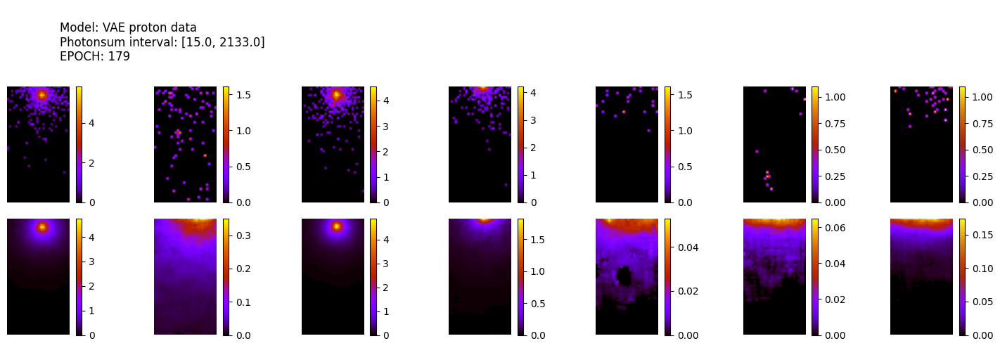

305/305 [==============================] - 1s 4ms/step
ws mean 11.04 ch1 0.01 ch2 5.94 ch3 0.14 ch4 21.51 ch5 27.58 Time for epoch 180 is 30.17431950569153 sec
55000 [Total loss: 41.74] [Recon_loss: 41.16] [KL loss: 0.83]
55100 [Total loss: 34.06] [Recon_loss: 33.64] [KL loss: 0.61]
55200 [Total loss: 35.72] [Recon_loss: 35.47] [KL loss: 0.35]


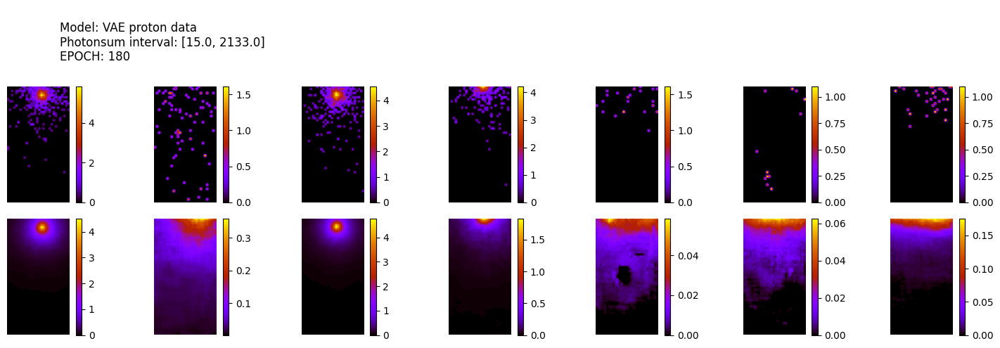

305/305 [==============================] - 1s 4ms/step
ws mean 10.12 ch1 0.01 ch2 5.16 ch3 0.14 ch4 20.17 ch5 25.11 Time for epoch 181 is 30.175126552581787 sec
55300 [Total loss: 42.72] [Recon_loss: 42.26] [KL loss: 0.65]
55400 [Total loss: 38.34] [Recon_loss: 38.12] [KL loss: 0.33]
55500 [Total loss: 26.53] [Recon_loss: 26.24] [KL loss: 0.42]


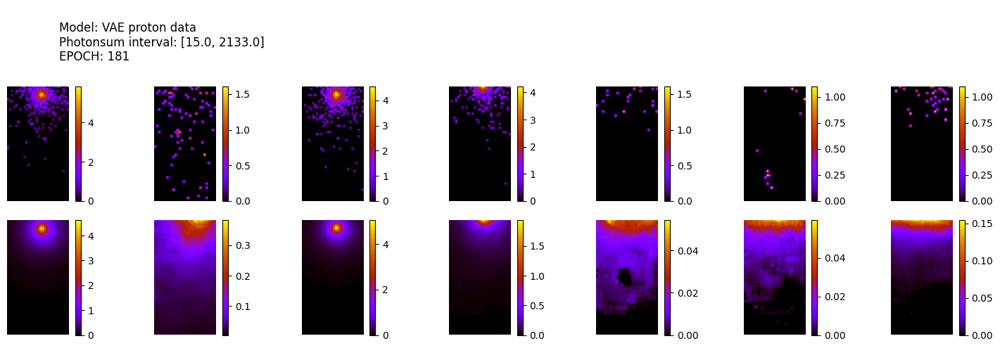

305/305 [==============================] - 1s 4ms/step
ws mean 8.37 ch1 0.01 ch2 5.40 ch3 0.13 ch4 15.48 ch5 20.84 Time for epoch 182 is 29.432113885879517 sec
55600 [Total loss: 38.78] [Recon_loss: 38.27] [KL loss: 0.74]
55700 [Total loss: 39.48] [Recon_loss: 38.90] [KL loss: 0.82]
55800 [Total loss: 40.39] [Recon_loss: 39.95] [KL loss: 0.62]


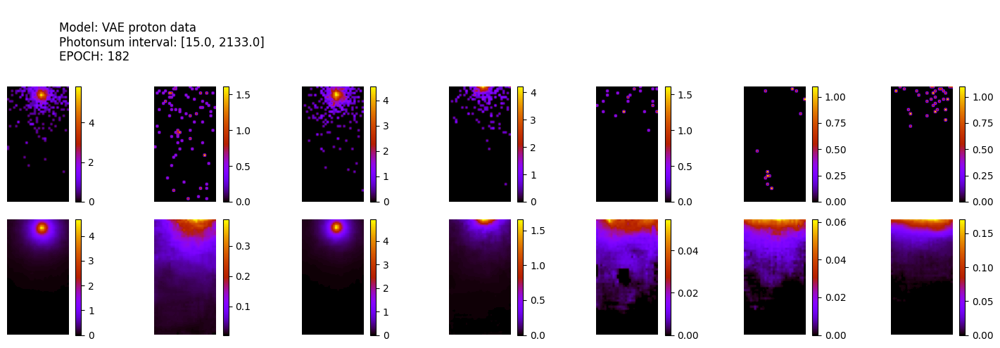

305/305 [==============================] - 1s 4ms/step
ws mean 9.49 ch1 0.01 ch2 5.51 ch3 0.11 ch4 18.10 ch5 23.72 Time for epoch 183 is 29.38711142539978 sec
55900 [Total loss: 31.29] [Recon_loss: 31.01] [KL loss: 0.39]
56000 [Total loss: 41.91] [Recon_loss: 41.55] [KL loss: 0.50]
56100 [Total loss: 36.68] [Recon_loss: 36.22] [KL loss: 0.65]


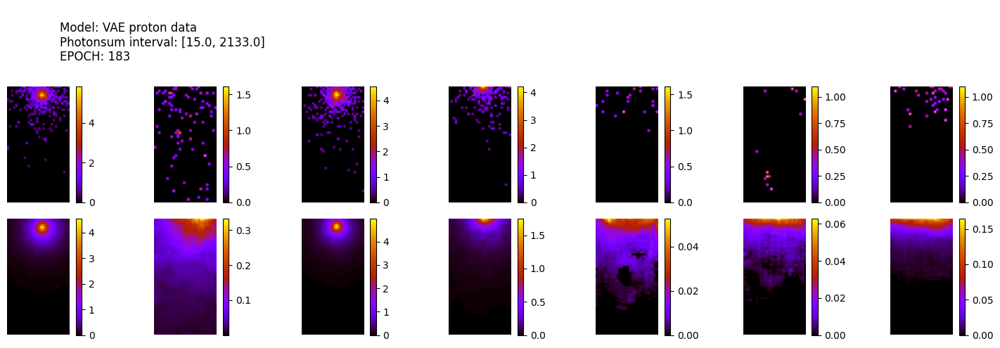

305/305 [==============================] - 1s 4ms/step
ws mean 10.57 ch1 0.01 ch2 5.67 ch3 0.12 ch4 20.61 ch5 26.42 Time for epoch 184 is 29.717615604400635 sec
56200 [Total loss: 44.12] [Recon_loss: 43.61] [KL loss: 0.72]
56300 [Total loss: 44.99] [Recon_loss: 44.44] [KL loss: 0.78]
56400 [Total loss: 44.70] [Recon_loss: 44.31] [KL loss: 0.56]


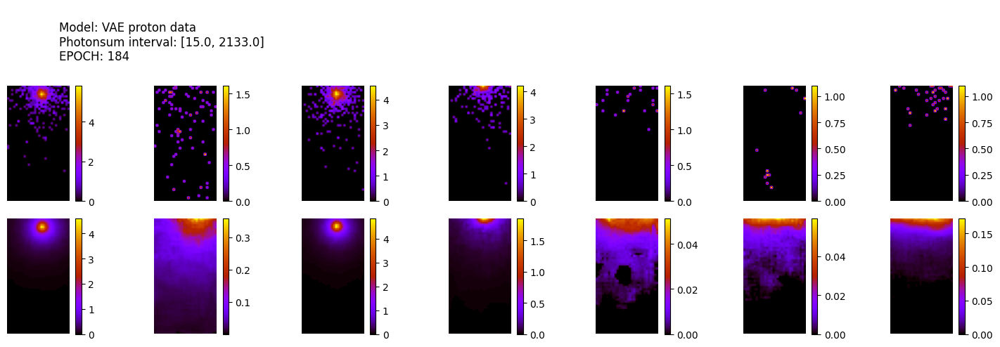

305/305 [==============================] - 1s 4ms/step
ws mean 13.42 ch1 0.01 ch2 5.96 ch3 0.16 ch4 27.57 ch5 33.43 Time for epoch 185 is 30.10545325279236 sec
56500 [Total loss: 39.79] [Recon_loss: 39.49] [KL loss: 0.43]
56600 [Total loss: 40.75] [Recon_loss: 40.38] [KL loss: 0.53]
56700 [Total loss: 39.43] [Recon_loss: 39.07] [KL loss: 0.53]


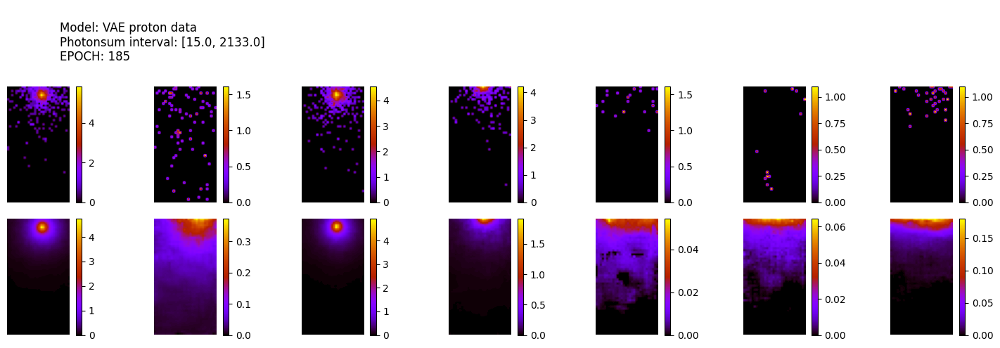

305/305 [==============================] - 1s 4ms/step
ws mean 10.77 ch1 0.01 ch2 5.41 ch3 0.13 ch4 21.48 ch5 26.84 Time for epoch 186 is 29.818236112594604 sec
56800 [Total loss: 41.64] [Recon_loss: 41.27] [KL loss: 0.53]
56900 [Total loss: 43.56] [Recon_loss: 42.92] [KL loss: 0.91]
57000 [Total loss: 43.36] [Recon_loss: 42.51] [KL loss: 1.21]


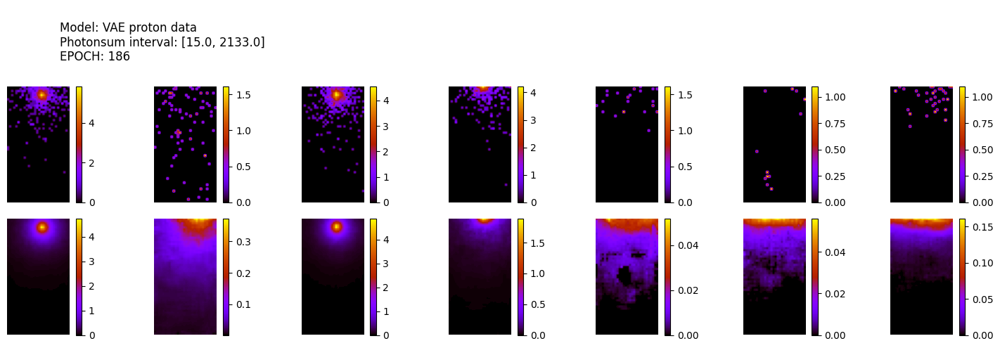

305/305 [==============================] - 1s 4ms/step
ws mean 10.18 ch1 0.01 ch2 5.87 ch3 0.11 ch4 19.50 ch5 25.39 Time for epoch 187 is 29.491445541381836 sec
57100 [Total loss: 43.16] [Recon_loss: 42.83] [KL loss: 0.47]
57200 [Total loss: 42.14] [Recon_loss: 41.78] [KL loss: 0.51]
57300 [Total loss: 39.67] [Recon_loss: 39.42] [KL loss: 0.36]


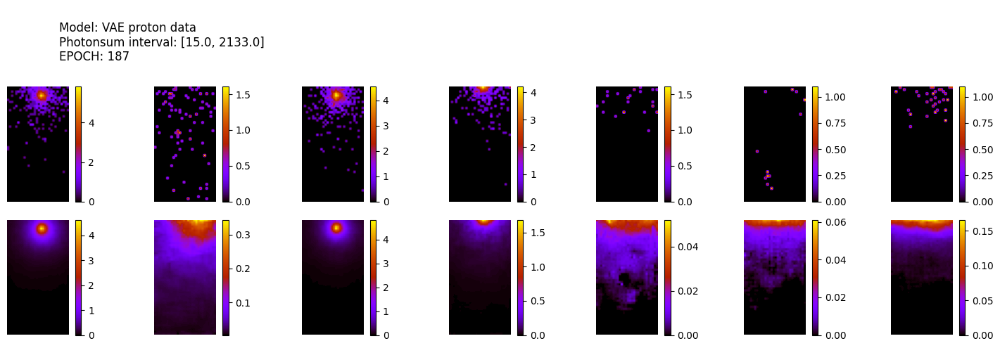

305/305 [==============================] - 1s 4ms/step
ws mean 11.28 ch1 0.01 ch2 5.99 ch3 0.12 ch4 22.10 ch5 28.19 Time for epoch 188 is 29.780551195144653 sec
57400 [Total loss: 34.35] [Recon_loss: 34.10] [KL loss: 0.35]
57500 [Total loss: 39.27] [Recon_loss: 38.84] [KL loss: 0.61]
57600 [Total loss: 33.57] [Recon_loss: 33.34] [KL loss: 0.33]


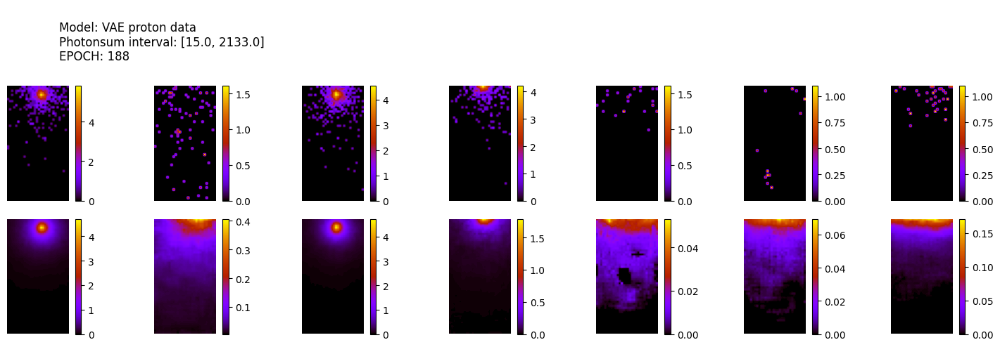

305/305 [==============================] - 1s 4ms/step
ws mean 9.87 ch1 0.01 ch2 5.29 ch3 0.12 ch4 19.40 ch5 24.52 Time for epoch 189 is 30.228089332580566 sec
57700 [Total loss: 37.24] [Recon_loss: 36.88] [KL loss: 0.51]
57800 [Total loss: 42.45] [Recon_loss: 42.12] [KL loss: 0.47]
57900 [Total loss: 37.86] [Recon_loss: 37.49] [KL loss: 0.54]


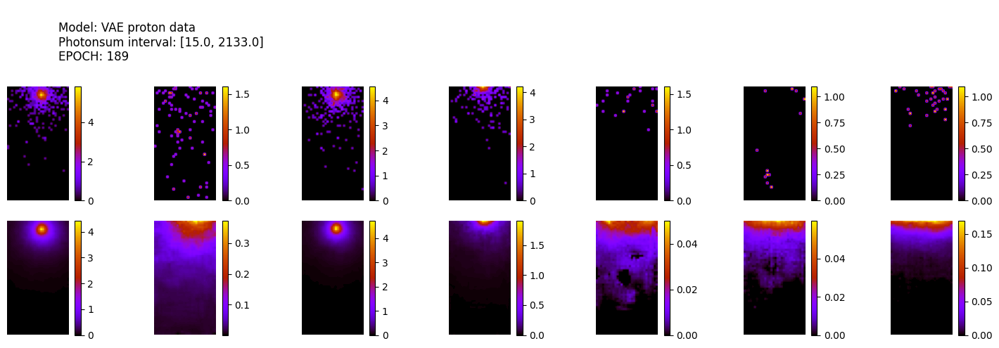

305/305 [==============================] - 1s 4ms/step
ws mean 14.86 ch1 0.01 ch2 5.83 ch3 0.18 ch4 31.19 ch5 37.10 Time for epoch 190 is 29.784650325775146 sec
58000 [Total loss: 39.93] [Recon_loss: 39.60] [KL loss: 0.48]
58100 [Total loss: 44.34] [Recon_loss: 43.87] [KL loss: 0.67]
58200 [Total loss: 36.52] [Recon_loss: 36.23] [KL loss: 0.41]


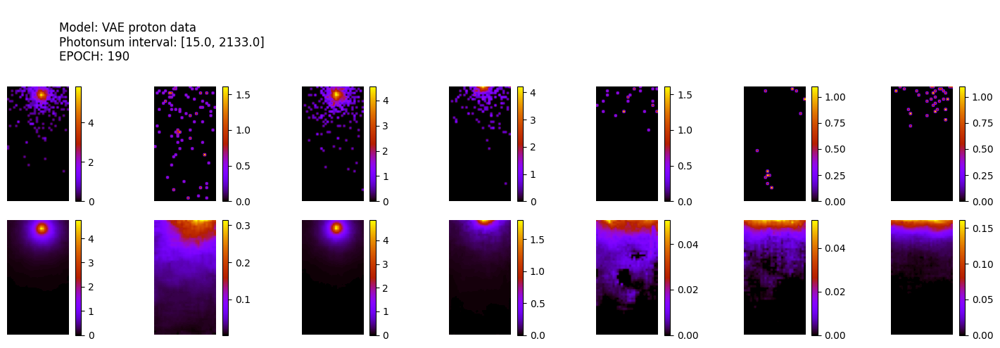

305/305 [==============================] - 1s 4ms/step
ws mean 9.92 ch1 0.01 ch2 6.00 ch3 0.13 ch4 18.61 ch5 24.86 Time for epoch 191 is 29.946149349212646 sec
58300 [Total loss: 38.68] [Recon_loss: 38.32] [KL loss: 0.51]
58400 [Total loss: 40.56] [Recon_loss: 40.20] [KL loss: 0.50]
58500 [Total loss: 41.08] [Recon_loss: 40.63] [KL loss: 0.63]


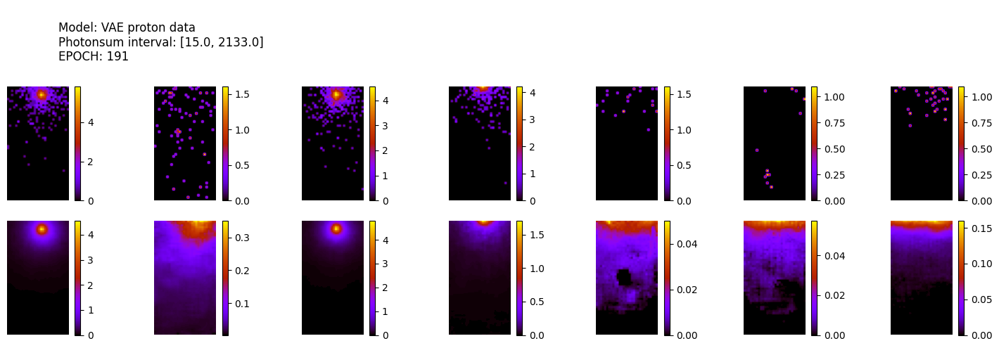

305/305 [==============================] - 1s 4ms/step
ws mean 12.22 ch1 0.01 ch2 5.29 ch3 0.16 ch4 25.23 ch5 30.42 Time for epoch 192 is 29.494582414627075 sec
58600 [Total loss: 36.38] [Recon_loss: 36.17] [KL loss: 0.30]
58700 [Total loss: 41.98] [Recon_loss: 41.54] [KL loss: 0.62]
58800 [Total loss: 41.91] [Recon_loss: 41.51] [KL loss: 0.57]


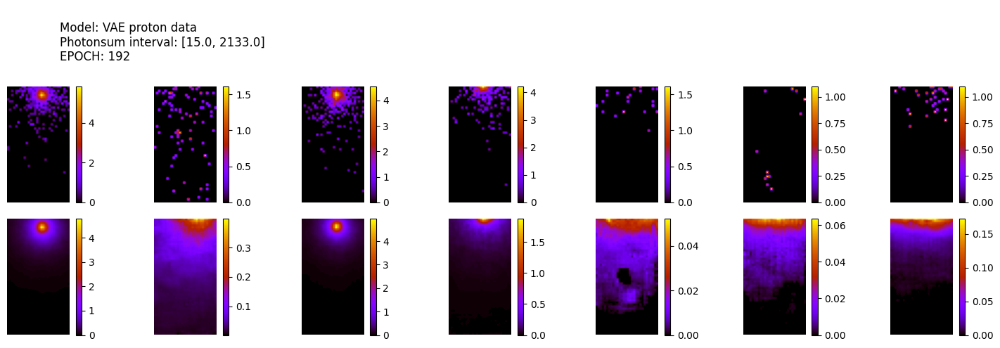

305/305 [==============================] - 1s 4ms/step
ws mean 9.84 ch1 0.01 ch2 5.13 ch3 0.14 ch4 19.43 ch5 24.50 Time for epoch 193 is 29.712388038635254 sec
58900 [Total loss: 42.41] [Recon_loss: 41.83] [KL loss: 0.83]
59000 [Total loss: 36.50] [Recon_loss: 36.19] [KL loss: 0.45]
59100 [Total loss: 34.91] [Recon_loss: 34.68] [KL loss: 0.33]


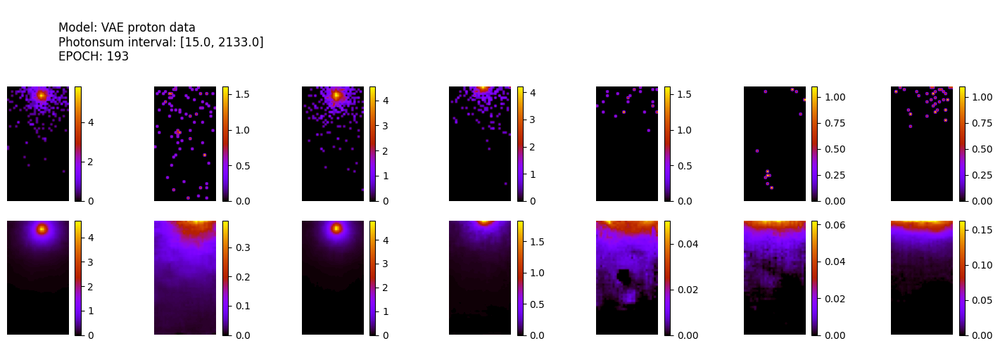

305/305 [==============================] - 1s 4ms/step
ws mean 10.64 ch1 0.01 ch2 5.35 ch3 0.12 ch4 21.21 ch5 26.51 Time for epoch 194 is 30.77685856819153 sec
59200 [Total loss: 39.98] [Recon_loss: 39.49] [KL loss: 0.70]
59300 [Total loss: 39.75] [Recon_loss: 39.45] [KL loss: 0.42]
59400 [Total loss: 43.16] [Recon_loss: 42.68] [KL loss: 0.68]


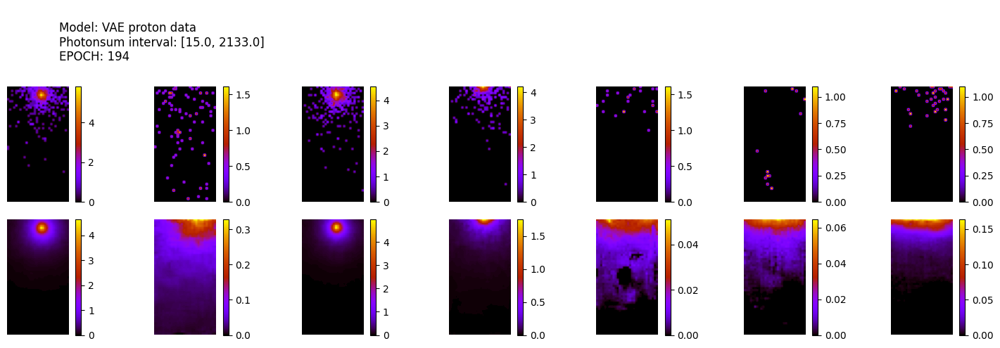

305/305 [==============================] - 1s 4ms/step
ws mean 9.65 ch1 0.01 ch2 5.41 ch3 0.15 ch4 18.66 ch5 24.01 Time for epoch 195 is 29.830894947052002 sec
59500 [Total loss: 42.20] [Recon_loss: 41.91] [KL loss: 0.41]
59600 [Total loss: 40.54] [Recon_loss: 40.21] [KL loss: 0.46]
59700 [Total loss: 32.62] [Recon_loss: 32.42] [KL loss: 0.29]


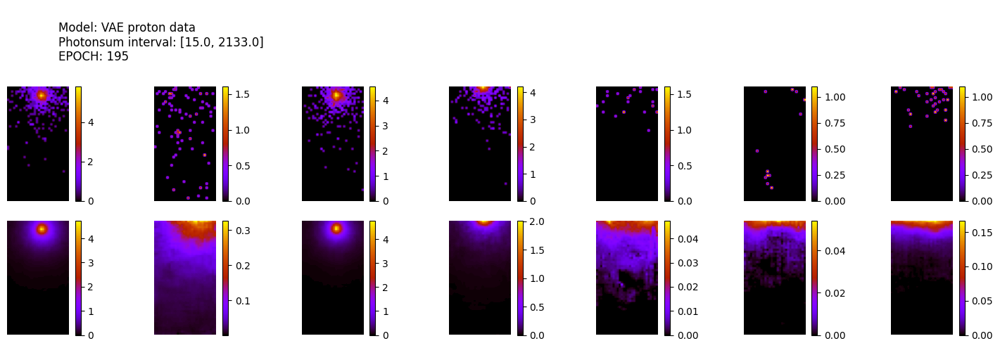

305/305 [==============================] - 1s 4ms/step
ws mean 12.07 ch1 0.01 ch2 6.28 ch3 0.13 ch4 23.81 ch5 30.13 Time for epoch 196 is 29.5973219871521 sec
59800 [Total loss: 40.83] [Recon_loss: 40.53] [KL loss: 0.44]
59900 [Total loss: 33.52] [Recon_loss: 33.28] [KL loss: 0.35]
60000 [Total loss: 43.11] [Recon_loss: 42.71] [KL loss: 0.56]


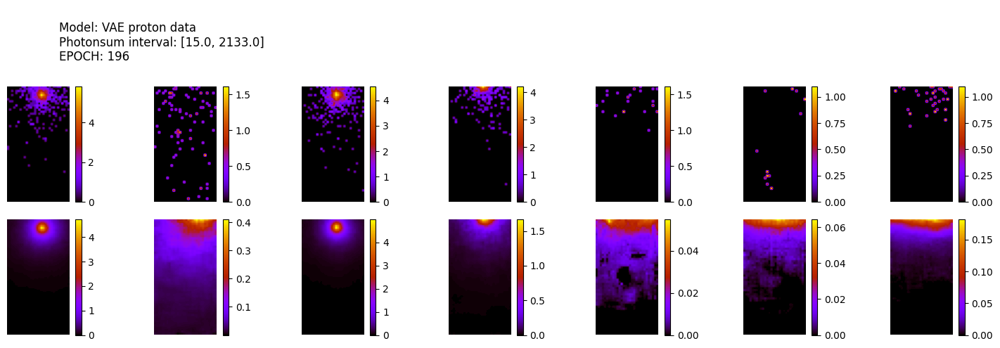

305/305 [==============================] - 1s 4ms/step
ws mean 6.85 ch1 0.01 ch2 5.14 ch3 0.11 ch4 11.93 ch5 17.09 Time for epoch 197 is 29.771698236465454 sec
60100 [Total loss: 47.84] [Recon_loss: 47.43] [KL loss: 0.59]
60200 [Total loss: 47.15] [Recon_loss: 46.64] [KL loss: 0.73]
60300 [Total loss: 29.53] [Recon_loss: 29.35] [KL loss: 0.26]


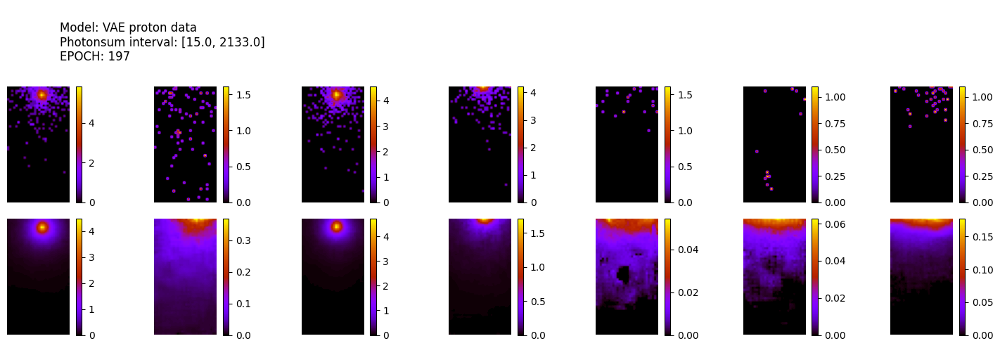

305/305 [==============================] - 1s 4ms/step
ws mean 11.76 ch1 0.01 ch2 5.38 ch3 0.14 ch4 23.97 ch5 29.29 Time for epoch 198 is 29.857327699661255 sec
60400 [Total loss: 44.32] [Recon_loss: 43.94] [KL loss: 0.55]
60500 [Total loss: 34.39] [Recon_loss: 34.09] [KL loss: 0.43]
60600 [Total loss: 37.12] [Recon_loss: 36.85] [KL loss: 0.38]


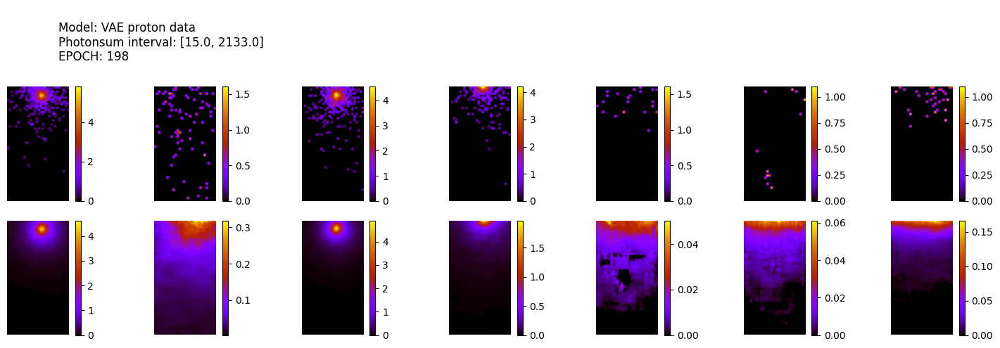

305/305 [==============================] - 1s 4ms/step
ws mean 9.76 ch1 0.01 ch2 4.98 ch3 0.13 ch4 19.43 ch5 24.27 Time for epoch 199 is 29.734996557235718 sec
60700 [Total loss: 36.50] [Recon_loss: 36.21] [KL loss: 0.42]
60800 [Total loss: 41.43] [Recon_loss: 41.10] [KL loss: 0.47]
60900 [Total loss: 39.39] [Recon_loss: 39.01] [KL loss: 0.54]
61000 [Total loss: 40.55] [Recon_loss: 40.06] [KL loss: 0.69]


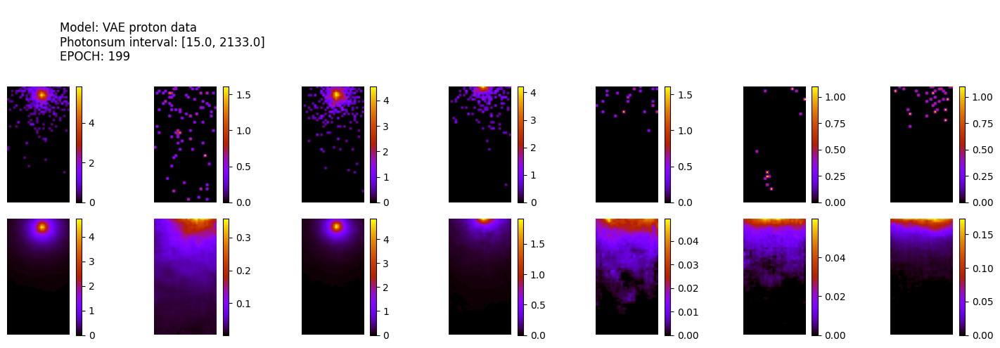

305/305 [==============================] - 1s 4ms/step
ws mean 13.96 ch1 0.01 ch2 6.07 ch3 0.16 ch4 28.64 ch5 34.93 Time for epoch 200 is 29.450714111328125 sec


In [ ]:
history=train(dataset_with_cond, EPOCHS)

## Visualize losses

In [22]:
import seaborn as sns

sns.set_context('notebook', font_scale = 1)

In [23]:
# total_loss, reconstruction_loss, kl_loss
history_losses = np.array([[float(loss) for loss in losses] for losses in history])

In [24]:
total_loss = history_losses[:,0]
reconstruction_loss = history_losses[:,1]
kl_loss = history_losses[:,2]

In [25]:
a4_dims = (14, 5)
def print_loss(loss_values, loss_str):
    fig, ax = plt.subplots(figsize=a4_dims)
    sns.lineplot(loss_values)
    plt.xscale('log')
    plt.yscale('log')
    ax.set_title(f"{loss_str} loss in each epoch")
    ax.set_xlabel("Epoch number")
    ax.set_ylabel(f"{loss_str} loss value")
    plt.savefig(os.path.join(filepath_img, f"{loss_str}_loss"))

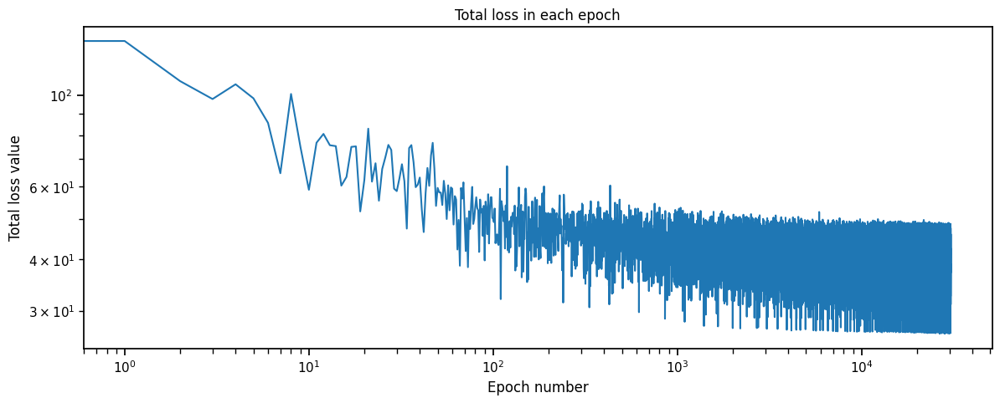

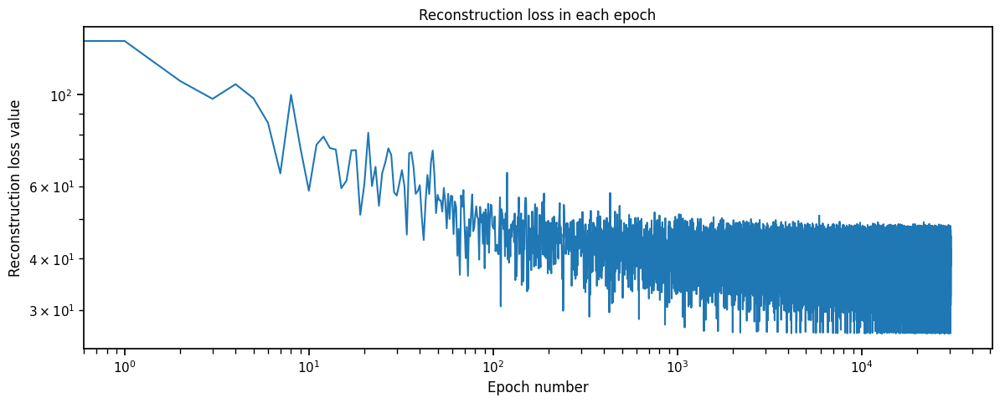

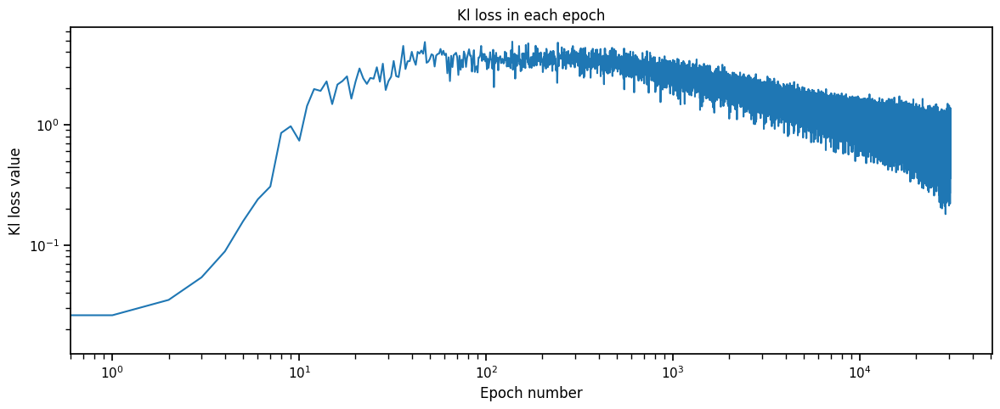

In [26]:
print_loss(total_loss, "Total")
print_loss(reconstruction_loss, "Reconstruction")
print_loss(kl_loss, "Kl")